# 0. Import library

In [100]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print("cuda is available")
else:
    print("cuda is NOT available")

import numpy as np
from tqdm import tqdm
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import time
import copy
from moving_average import moving_average_1d

import importlib
import policy
importlib.reload(policy)
from policy import PolicyNN

from nn_functions import surrogate

import sys
sys.path.append('../1_model')
from TiDE import TideModule, quantile_loss  


cuda is available


# 1-1. Import Data 

In [101]:
df_all = pd.read_csv('../0_data/merged_df_2_99_temp_depth.csv')
print(df_all.shape)
print(df_all.columns)

nan_rows = df_all[df_all.isna().any(axis=1)]

df_all = df_all.dropna()

loc_X = df_all["X"].to_numpy().reshape(-1,1)
loc_Y = df_all["Y"].to_numpy().reshape(-1,1)
loc_Z = df_all["Z"].to_numpy().reshape(-1,1)
dist_X = df_all["Dist_to_nearest_X"].to_numpy().reshape(-1,1)
dist_Y = df_all["Dist_to_nearest_Y"].to_numpy().reshape(-1,1)
# dist_Z = df_all["Dist_to_nearest_Z"].to_numpy()[::2].reshape(-1,1)
scan_spd = df_all["scanning_speed"].to_numpy().reshape(-1,1)
laser_power = df_all["Laser_power"].to_numpy().reshape(-1,1)
laser_on_off = df_all["laser_power_number"].to_numpy().reshape(-1,1)

# apply moving average for mp temp
mp_temp_raw = df_all["melt_pool_temperature"].to_numpy()
mp_temp_mv = moving_average_1d(mp_temp_raw,4)
mp_temp = copy.deepcopy(mp_temp_raw)
mp_temp[1:-2] = mp_temp_mv
mp_temp = mp_temp.reshape(-1,1)

# apply moving average for mp depth
mp_depth_raw = df_all["melt_pool_depth"].to_numpy()
mp_depth_mv = moving_average_1d(mp_depth_raw,4)
mp_depth = copy.deepcopy(mp_depth_raw)
mp_depth[1:-2] = mp_depth_mv
mp_depth = mp_depth.reshape(-1,1)       


(610615, 12)
Index(['time_index', 'melt_pool_temperature', 'melt_pool_depth',
       'scanning_speed', 'X', 'Y', 'Z', 'Dist_to_nearest_X',
       'Dist_to_nearest_Y', 'Dist_to_nearest_Z', 'Laser_power',
       'laser_power_number'],
      dtype='object')


## 1-2. Normalize data

In [102]:
# stack input array
x_original_scale = np.concatenate((loc_Z, dist_X, dist_Y, laser_power), axis=1)
y_original_scale = np.concatenate((mp_temp, mp_depth), axis=1)

# scaling
x_max = np.max(x_original_scale,0).reshape(1,-1)
x_min = np.min(x_original_scale,0).reshape(1,-1) 
y_max = np.max(y_original_scale,0).reshape(1,-1) 
y_min = np.min(y_original_scale,0).reshape(1,-1)

print("x_max:", np.round(x_max, 3).tolist())
print("x_min:", np.round(x_min, 3).tolist())
print("y_max:", np.round(y_max, 3).tolist())
print("y_min:", np.round(y_min, 3).tolist())

x_max: [[7.5, 20.0, 20.0, 732.298]]
x_min: [[0.0, 0.75, 0.75, 504.26]]
y_max: [[4509.855, 0.551]]
y_min: [[436.608, -0.559]]


In [103]:
class scalers():
    def __init__(self,x_max, x_min, y_max, y_min) -> None:
        self.x_max = x_max
        self.x_min = x_min
        self.y_max = y_max
        self.y_min = y_min
        
        return None
    
    def scaler_x(self, x_original, dim_id = -1):
        if dim_id == -1:
            x_s = -1 + 2 * ((x_original - self.x_min) / (self.x_max-self.x_min))
            return x_s
        else: 
            x_s = -1 + 2 * (x_original - self.x_min[0,dim_id]) / (self.x_max[0,dim_id] - self.x_min[0,dim_id])
            return x_s
    
    def inv_scaler_x(self, x_s, dim_id = -1):
        
        if dim_id == -1:
            x_original = (x_s + 1)*0.5*(self.x_max-self.x_min) + self.x_min
            return x_original
        else: 
            x_original = (x_s + 1)*0.5*(self.x_max[0,dim_id] - self.x_min[0,dim_id]) + self.x_min[0,dim_id]
            return x_original
        
    def scaler_y(self, y_original):
        return -1 + 2 * ((y_original - self.y_min) / (self.y_max-self.y_min))
    
    def inv_scaler_y(self, y_s):
        return (y_s + 1)*0.5*(self.y_max-self.y_min) + self.y_min

In [104]:
scaler = scalers(x_max, x_min, y_max, y_min)

x_s = scaler.scaler_x(x_original_scale)
y_s = scaler.scaler_y(y_original_scale)

print("x_s range:", np.min(x_s), "to", np.max(x_s))
print("y_s range:", np.min(y_s), "to", np.max(y_s))

print("x_s shape:", x_s.shape)
print("y_s shape:", y_s.shape)

x_s range: -1.0 to 1.0
y_s range: -1.0 to 1.0
x_s shape: (610417, 4)
y_s shape: (610417, 2)


## 1-3. Generate data

In [105]:
length = y_s.shape[0]

y_s_ref = np.random.uniform(0.0, 1.0, size=(length, 1))

e = 0.0001
y_depth_low = np.random.uniform(0.1423-e, 0.1423+e, size = (length,1))
y_depth_up = np.random.uniform(0.4126-e, 0.4126+e, size = (length,1))

y_s_const = np.concatenate((y_depth_low, y_depth_up), axis=1)

print("y_s_ref shape:", y_s_ref.shape)
print("y_s_const shape:", y_s_const.shape)

y_s_ref shape: (610417, 1)
y_s_const shape: (610417, 2)


## 1-4. Split data

In [106]:
import numpy as np
import pandas as pd
import torch
import copy
from tqdm import tqdm

# =====================================================
# 1. Load & preprocess raw data
# =====================================================
df_all = pd.read_csv('../0_data/merged_df_2_99_temp_depth.csv')

print(df_all.shape)
print(df_all.columns)

# ---- global time index (핵심) ----
df_all = df_all.reset_index(drop=True)
df_all["time_id"] = np.arange(len(df_all))

# ---- NaN handling (time_id 유지) ----
nan_rows = df_all[df_all.isna().any(axis=1)]
df_all = df_all.dropna().reset_index(drop=True)

# =====================================================
# 2. Feature extraction
# =====================================================
loc_Z = df_all["Z"].to_numpy().reshape(-1, 1)
dist_X = df_all["Dist_to_nearest_X"].to_numpy().reshape(-1, 1)
dist_Y = df_all["Dist_to_nearest_Y"].to_numpy().reshape(-1, 1)
laser_power = df_all["Laser_power"].to_numpy().reshape(-1, 1)

# ---- global time id ----
time_id_all = df_all["time_id"].to_numpy()

# =====================================================
# 3. Melt pool smoothing
# =====================================================
mp_temp_raw = df_all["melt_pool_temperature"].to_numpy()
mp_temp_mv = moving_average_1d(mp_temp_raw, 4)
mp_temp = copy.deepcopy(mp_temp_raw)
mp_temp[1:-2] = mp_temp_mv
mp_temp = mp_temp.reshape(-1, 1)

mp_depth_raw = df_all["melt_pool_depth"].to_numpy()
mp_depth_mv = moving_average_1d(mp_depth_raw, 4)
mp_depth = copy.deepcopy(mp_depth_raw)
mp_depth[1:-2] = mp_depth_mv
mp_depth = mp_depth.reshape(-1, 1)

# =====================================================
# 4. Stack original-scale arrays
# =====================================================
x_original = np.concatenate((loc_Z, dist_X, dist_Y, laser_power), axis=1)  # (N,4)
y_original = np.concatenate((mp_temp, mp_depth), axis=1)                  # (N,2)

# =====================================================
# 5. Scaling (-1 ~ 1)
# =====================================================
x_max = np.max(x_original, axis=0, keepdims=True)
x_min = np.min(x_original, axis=0, keepdims=True)
y_max = np.max(y_original, axis=0, keepdims=True)
y_min = np.min(y_original, axis=0, keepdims=True)

scaler = scalers(x_max, x_min, y_max, y_min)

x_s = scaler.scaler_x(x_original)
y_s = scaler.scaler_y(y_original)

# =====================================================
# 6. Reference / Constraint (global arrays)
# =====================================================
length = y_s.shape[0]

# =====================================================
# Global reference (temperature)
# =====================================================
y_ref_global = y_s[:, 0:1]   # (N, 1)


# depth constraint (global)
e = 1e-4
y_depth_low = np.random.uniform(0.1423 - e, 0.1423 + e, size=(length, 1))
y_depth_up  = np.random.uniform(0.4126 - e, 0.4126 + e, size=(length, 1))
y_const_global = np.concatenate((y_depth_low, y_depth_up), axis=1)  # (N,2)

# =====================================================
# 7. Train / Validation split (time-consistent)
# =====================================================
cutoff_index = int(np.round(0.8 * length))

x_train, y_train = x_s[:cutoff_index], y_s[:cutoff_index]
x_val,   y_val   = x_s[cutoff_index:], y_s[cutoff_index:]

time_id_train = time_id_all[:cutoff_index]
time_id_val   = time_id_all[cutoff_index:]

# =====================================================
# 7. (삭제/변경) Train/Val split을 먼저 하지 말고
#    8번에서 전체 샘플을 먼저 만든 뒤 shuffle split
# =====================================================

window = 50
P = 50
N = length

# 전체에서 만들 수 있는 샘플 개수
# i는 "현재 시점(start of future)" 인덱스
# i는 [window, N-P) 범위
n_all = (N - P) - window

x_past_all = np.empty((n_all, window, 4))
y_past_all = np.empty((n_all, window, 2))
x_future_all = np.empty((n_all, P, 3))
y_ref_all_seq = np.empty((n_all, P, 1))
y_const_all_seq = np.empty((n_all, P, 2))
time_idx_all_seq = np.empty(n_all, dtype=np.int64)

for i in tqdm(range(window, N - P)):
    j = i - window

    x_past_all[j] = x_s[i-window:i]
    y_past_all[j] = y_s[i-window:i]
    x_future_all[j] = x_s[i:i+P, :3]

    # reference
    scalar_shift = 0
    y_ref_all_seq[j] = y_ref_global[i:i+P] + scalar_shift

    # constraint
    y_const_all_seq[j] = y_const_global[i:i+P]

    # time index (글로벌)
    time_idx_all_seq[j] = time_id_all[i]

# =====================================================
# 8. Shuffle 후 8:2 split (샘플 단위)
# =====================================================
rng = np.random.default_rng(42)  # 재현성
perm = rng.permutation(n_all)

cut = int(np.round(0.8 * n_all))
train_idx = perm[:cut]
val_idx   = perm[cut:]

x_past_train = x_past_all[train_idx]
y_past_train = y_past_all[train_idx]
x_future_train = x_future_all[train_idx]
y_ref_train_seq = y_ref_all_seq[train_idx]
y_const_train_seq = y_const_all_seq[train_idx]
time_idx_train = time_idx_all_seq[train_idx]

x_past_val = x_past_all[val_idx]
y_past_val = y_past_all[val_idx]
x_future_val = x_future_all[val_idx]
y_ref_val_seq = y_ref_all_seq[val_idx]
y_const_val_seq = y_const_all_seq[val_idx]
time_idx_val = time_idx_all_seq[val_idx]

# =====================================================
# 9. Torch tensor conversion
# =====================================================
x_past_train = torch.tensor(x_past_train, dtype=torch.float32)
y_past_train = torch.tensor(y_past_train, dtype=torch.float32)
x_future_train = torch.tensor(x_future_train, dtype=torch.float32)
y_ref_train_seq = torch.tensor(y_ref_train_seq, dtype=torch.float32)
y_const_train_seq = torch.tensor(y_const_train_seq, dtype=torch.float32)
time_idx_train = torch.tensor(time_idx_train, dtype=torch.long)

x_past_val = torch.tensor(x_past_val, dtype=torch.float32)
y_past_val = torch.tensor(y_past_val, dtype=torch.float32)
x_future_val = torch.tensor(x_future_val, dtype=torch.float32)
y_ref_val_seq = torch.tensor(y_ref_val_seq, dtype=torch.float32)
y_const_val_seq = torch.tensor(y_const_val_seq, dtype=torch.float32)
time_idx_val = torch.tensor(time_idx_val, dtype=torch.long)


# =====================================================
# 10. Shape check
# =====================================================
print("Train shapes:")
print("x_past:", x_past_train.shape)
print("y_past:", y_past_train.shape)
print("x_future:", x_future_train.shape)
print("y_ref:", y_ref_train_seq.shape)
print("y_const:", y_const_train_seq.shape)
print("time_idx:", time_idx_train.shape)

print("\nVal shapes:")
print("x_past:", x_past_val.shape)
print("y_past:", y_past_val.shape)
print("x_future:", x_future_val.shape)
print("y_ref:", y_ref_val_seq.shape)
print("y_const:", y_const_val_seq.shape)
print("time_idx:", time_idx_val.shape)


(610615, 12)
Index(['time_index', 'melt_pool_temperature', 'melt_pool_depth',
       'scanning_speed', 'X', 'Y', 'Z', 'Dist_to_nearest_X',
       'Dist_to_nearest_Y', 'Dist_to_nearest_Z', 'Laser_power',
       'laser_power_number'],
      dtype='object')


100%|██████████| 610317/610317 [00:03<00:00, 185888.00it/s]


Train shapes:
x_past: torch.Size([488254, 50, 4])
y_past: torch.Size([488254, 50, 2])
x_future: torch.Size([488254, 50, 3])
y_ref: torch.Size([488254, 50, 1])
y_const: torch.Size([488254, 50, 2])
time_idx: torch.Size([488254])

Val shapes:
x_past: torch.Size([122063, 50, 4])
y_past: torch.Size([122063, 50, 2])
x_future: torch.Size([122063, 50, 3])
y_ref: torch.Size([122063, 50, 1])
y_const: torch.Size([122063, 50, 2])
time_idx: torch.Size([122063])


In [107]:
batch_size = 256

# ------------------ Training loader ------------------
train_dataset = TensorDataset(
    x_past_train,
    y_past_train,
    x_future_train,
    y_ref_train_seq,
    y_const_train_seq,
    time_idx_train          # ⭐ 반드시 포함
)

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True           # ⭐ 핵심 수정
)

# ------------------ Validation loader ------------------
val_dataset = TensorDataset(
    x_past_val,
    y_past_val,
    x_future_val,
    y_ref_val_seq,
    y_const_val_seq,
    time_idx_val
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False
)


# 2. Loss function

In [108]:
import torch
from typing import Optional, Union, List


ll = 0.5

def _to_nominal_temp(
    tide_output_nominal: torch.Tensor
) -> torch.Tensor:
    """
    Convert nominal TiDE output to temperature trajectory: [B, T]
    Accepts:
      - [B, T, D]                 (already median/mean)
      - [B, T, D, Q]              (quantile output; we take median over Q)
    Returns:
      temp: [B, T]
    """
    if tide_output_nominal.ndim == 4:
        # [B, T, D, Q] -> [B, T, D]
        tide_med = tide_output_nominal.median(dim=-1).values
    elif tide_output_nominal.ndim == 3:
        # [B, T, D]
        tide_med = tide_output_nominal
    else:
        raise ValueError(
            f"nominal tide output must be [B,T,D] or [B,T,D,Q], got {tide_output_nominal.shape}"
        )
    return tide_med[:, :, 0]  # temperature channel -> [B, T]


def _uq_from_ensemble(
    tide_output_ens: Union[torch.Tensor, List[torch.Tensor]],
    use_channel: int = 0,
) -> torch.Tensor:
    if isinstance(tide_output_ens, list):
        ens = torch.stack(tide_output_ens, dim=0)
    else:
        ens = tide_output_ens

    if ens.ndim != 5:
        raise ValueError(f"ensemble tide output must be [M,B,T,D,Q], got {ens.shape}")

    # 1. 특정 채널 선택 및 Quantile 차이 계산 (상한-하한)
    # y: [M, B, T, Q] -> width: [M, B, T]
    y = ens[:, :, :, use_channel, :]
    width = y[..., -1] - y[..., 0]

    # 2. 제곱 연산 (Square)
    width_sq = width ** 2

    # 3. 시간 차원(T)에 대해 평균 후 루트 (Mean & Sqrt)
    # width_rms: [M, B] (각 모델/배치별 시간 평균 불확실성)
    width_rms = torch.sqrt(width_sq.mean(dim=2) + 1e-6)

    # 4. 모델(M) 차원에서 가장 큰 값 선택 (Max)
    # uq_per_batch: [B]
    uq_per_batch = width_rms.max(dim=0).values

    # 5. 배치(B)에 대해 중앙값 혹은 평균 취하여 최종 스칼라 생성
    # 다른 Loss들과 맥락을 맞추기 위해 .mean()을 권장하지만, 기존처럼 .median()도 가능합니다.
    uq_scalar = uq_per_batch.mean() 

    return uq_scalar


def DPC_loss(
    x_past: torch.Tensor,
    tide_output_nominal: torch.Tensor,
    reference: torch.Tensor,
    u_output: torch.Tensor,
    constraint: torch.Tensor,
    tide_output_ens: Optional[Union[torch.Tensor, List[torch.Tensor]]] = None,
    lambda_uq: float = ll, #todo
    w_tracking: float = 1.0,
    w_smooth: float = 1.0,
    w_constraint: float = 3.0,
    uq_channel: int = 0,   # 0: temperature, 1: depth
):
    """
    Nominal trajectory losses (tracking/smooth/constraint) + Ensemble UQ penalty.

    Inputs:
      - tide_output_nominal: representative output for tracking/constraint
            [B,T,D] or [B,T,D,Q]
      - tide_output_ens: ensemble outputs for uncertainty penalty
            [M,B,T,D,Q] or list of [B,T,D,Q]
      - reference: [B,T,1] (uses [:,:,0])
      - u_output: [B,T,1] or [B,T,U]
      - constraint: [B,T,2] (low, high) on depth channel
    """

    # =========================
    # 1) Nominal tracking loss
    # =========================
    tide_temp = _to_nominal_temp(tide_output_nominal)  # [B,T]
    ref_temp = reference[:, :, 0]                      # [B,T]
    tracking_loss = (ref_temp - tide_temp) ** 2        # [B,T]

    # time-dependent Q weights (currently all 1.0 유지)
    T = tracking_loss.shape[1]
    q_weights = torch.linspace(1.0, 1.0, T, device=tracking_loss.device).unsqueeze(0)
    tracking_loss = tracking_loss * q_weights

    # =========================
    # 2) Smoothness loss
    # =========================
    u_diff = u_output[:, 1:, :] - u_output[:, :-1, :]
    smoothness_loss = u_diff ** 2

    # =========================
    # 3) Constraint loss (depth)
    # =========================
    # nominal tide depth: [B,T]
    if tide_output_nominal.ndim == 4:
        tide_med = tide_output_nominal.median(dim=-1).values  # [B,T,D]
    else:
        tide_med = tide_output_nominal                        # [B,T,D]

    tide_depth = tide_med[:, :, 1]  # depth channel
    low_violation = torch.relu(constraint[:, :, 0] - tide_depth) ** 2
    up_violation  = torch.relu(tide_depth - constraint[:, :, 1]) ** 2
    constraint_loss = 0.0 * low_violation + up_violation

    # =========================
    # 4) Aggregate nominal losses
    # =========================
    L_tracking   = torch.sqrt(tracking_loss.mean())
    L_smooth     = torch.sqrt(smoothness_loss.mean())
    L_constraint = torch.sqrt(constraint_loss.mean())

    loss = (
        w_tracking * L_tracking +
        w_smooth * L_smooth +
        w_constraint * L_constraint
    )

    # =========================
    # 5) Ensemble UQ penalty
    # =========================
    L_uq = torch.tensor(0.0, device=loss.device)
    if tide_output_ens is not None and lambda_uq > 0.0:
        L_uq = _uq_from_ensemble(tide_output_ens, use_channel=uq_channel)
        loss = loss + lambda_uq * L_uq

    print(
    f"L_tracking: {L_tracking.item():.4f}, "
    f"L_smooth: {L_smooth.item():.4f}, "
    f"L_constraint: {L_constraint.item():.4f}, "
    f"L_uq: {L_uq.item():.4f}"
    )


    return loss, L_tracking.item(), L_smooth.item(), L_constraint.item(), L_uq.item()


# 3. Import TiDE model (NN model)

In [109]:
import pickle
import os
import numpy as np
from collections import OrderedDict

# ====== 1. 쪼개진 ensemble 파일들이 있는 디렉토리 ======
ensemble_dir = (
    "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/tide/"
    "ensemble_0203"
)

files = sorted([
    os.path.join(ensemble_dir, f)
    for f in os.listdir(ensemble_dir)
    if f.endswith(".pkl")
])

assert len(files) > 0, "No ensemble split files found"

print(f"🔍 Found {len(files)} ensemble files")

# ====== 2. 전부 로드 ======
all_states = []
all_seeds = []

for fp in files:
    with open(fp, "rb") as f:
        p = pickle.load(f)

    # 각 파일은 단일 모델
    all_states.append(p["models_state_dict"][0])
    all_seeds.append(p.get("seeds", [None])[0])

# ====== 3. 메타 정보는 첫 파일 기준 ======
with open(files[0], "rb") as f:
    base = pickle.load(f)

sys_params = dict()
sys_params["x_max"] = base["x_max"]
sys_params["x_min"] = base["x_min"]
sys_params["y_max"] = base["y_max"]
sys_params["y_min"] = base["y_min"]
sys_params["P"] = base["P"]
sys_params["window"] = base["window"]

# ====== 4. 예전 코드와 호환되게 key 맞춰주기 ======
sys_params["ensemble_state_dict"] = all_states        # ★ 핵심
sys_params["best_models_list"] = all_states            # (예전 코드 호환용)
sys_params["num_ensembles"] = len(all_states)
sys_params["seeds"] = all_seeds

print("=== TOP LEVEL ===")
print("type:", type(sys_params))
print("keys:", list(sys_params.keys()))


🔍 Found 5 ensemble files
=== TOP LEVEL ===
type: <class 'dict'>
keys: ['x_max', 'x_min', 'y_max', 'y_min', 'P', 'window', 'ensemble_state_dict', 'best_models_list', 'num_ensembles', 'seeds']


In [110]:
TiDE_ensemble = []

for idx, f in enumerate(files, start=1):
    with open(os.path.join(ensemble_dir, f), "rb") as fh:
        p = pickle.load(fh)

    state_dict = p["models_state_dict"][0]
    P = p["P"]
    window = p["window"]

    output_dim = 2
    future_cov_dim = 4

    model = TideModule(
        input_dim = output_dim + future_cov_dim,
        output_dim = output_dim,
        future_cov_dim = future_cov_dim,
        static_cov_dim = 0,
        input_chunck_length = window,
        output_chunk_length = P,
        nr_params = 3,
        num_encoder_layers = 1,
        num_decoder_layers = 1,
        decoder_output_dim = 16,
        hidden_size = 128,
        temporal_decoder_hidden = 32,
        temporal_width_past = 4,
        temporal_width_future = 4,
        use_layer_norm = True,
        dropout = 0.2,
    )

    model.load_state_dict(state_dict)
    model.eval()
    model = model.to(device)

    # 🔥 실제 변수명 생성
    globals()[f"model_{idx}"] = model

    TiDE_ensemble.append(model)

print(f"✅ Loaded {len(TiDE_ensemble)} TiDE ensemble models")


✅ Loaded 5 TiDE ensemble models


# 4. Train

In [111]:
## random tide !!!
# 
import random
import copy
import torch
from torch.utils.data import Dataset

# =========================
# Aug samples wrapper
# =========================
class ListDataset(Dataset):
    """
    aug_samples: list of tuples
      (x_past, y_past, x_future, y_ref, y_const, time_idx)
    """
    def __init__(self, samples):
        self.samples = samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        return self.samples[idx]


# =========================
# Build mapping: time_idx -> base sample index
# =========================
def build_time_to_sample_index(time_idx_tensor: torch.Tensor):
    """
    time_idx_tensor: shape (n_train,), dtype long
    returns: dict { int(time_idx) : int(sample_idx) }
    """
    time_to_j = {}
    # time_idx_tensor is on CPU typically; ensure it is
    t = time_idx_tensor.detach().cpu().tolist()
    for j, tid in enumerate(t):
        time_to_j[int(tid)] = int(j)
    return time_to_j

import random
import torch

import random
import torch

@torch.no_grad()
def rollout_k_step_augment_m(
    policy_model,
    tide_model,            # list of TiDE models (ensemble)
    x_past_train,          # (N, window, 4)
    y_past_train,          # (N, window, 2)
    x_future_train,        # (N, P, 3)
    y_ref_train_seq,       # (N, P, 1)
    y_const_train_seq,     # (N, P, 2)
    time_idx_train,        # (N,)
    time_to_j,             # dict: time_idx -> j
    m: int,
    device,
    step: int = 50,
    max_tries_factor: int = 20,
):
    """
    K-step rollout augmentation (random TiDE sampling).

    - rollout은 deterministic: TiDE mid(0.5 quantile)만 사용
    - rollout sample마다 ensemble 중 TiDE 하나를 random 선택
    - uncertainty / width / max 는 rollout에서 사용하지 않음
    - TiDE output shape: (1, P, 2, 3)

    Returns:
      new_samples: list of tuples
        (x_past_new, y_past_new, x_future_next, y_ref_next, y_const_next, time_idx_next)
      All returned tensors are on CPU.
    """

    policy_model.eval()
    for m_tide in tide_model:
        m_tide.eval()

    n, window, _ = x_past_train.shape
    P = x_future_train.shape[1]

    if n == 0 or m <= 0:
        return []

    # step sanity
    if step <= 0:
        raise ValueError(f"step must be positive, got {step}")
    if step > P:
        raise ValueError(f"step ({step}) cannot exceed P ({P})")
    if step > window:
        raise ValueError(f"step ({step}) cannot exceed window ({window})")

    new_samples = []
    tries = 0
    max_tries = max_tries_factor * m

    while len(new_samples) < m and tries < max_tries:
        tries += 1

        # -------------------------
        # (0) TiDE 선택
        # -------------------------
        tide = random.choice(tide_model)

        # 1) pick base sample
        j = random.randrange(n)

        t_cur = int(time_idx_train[j].item())
        t_next = t_cur + step

        if t_next not in time_to_j:
            continue
        j_next = time_to_j[t_next]

        # 2) gather tensors
        x_past = x_past_train[j:j+1].to(device)       # (1,w,4)
        y_past = y_past_train[j:j+1].to(device)       # (1,w,2)

        x_future = x_future_train[j:j+1].to(device)   # (1,P,3)
        y_ref = y_ref_train_seq[j:j+1].to(device)     # (1,P,1)
        y_const = y_const_train_seq[j:j+1].to(device) # (1,P,2)

        # 3) policy forward
        policy_in_past = torch.cat((x_past, y_past), dim=2)             # (1,w,6)
        policy_in_future = torch.cat((x_future, y_ref, y_const), dim=2) # (1,P,6)
        u_seq = policy_model((policy_in_past, policy_in_future))        # (1,P,1)

        # 4) TiDE forward (SINGLE MODEL)
        x_future_tide = torch.cat((x_future, u_seq), dim=2)             # (1,P,4)
        past_cov = torch.cat((y_past, x_past), dim=2)                   # (1,w,6)

        tide_pred = tide((past_cov, x_future_tide, None))
        # expected: (1,P,2,3)

        if tide_pred.ndim != 4 or tide_pred.shape[-1] != 3:
            raise ValueError(
                f"TiDE output must be (1,P,2,3), got {tide_pred.shape}"
            )

        # 5) rollout prediction: mid only
        tide_pred_mid = tide_pred[..., 1]   # (1,P,2)

        # 6) take first `step`
        u_step = u_seq[:, :step, :]              # (1,step,1)
        yhat_step = tide_pred_mid[:, :step, :]  # (1,step,2)

        # 7) build new past window
        x_step = torch.cat((x_future[:, :step, :], u_step), dim=2)  # (1,step,4)

        x_past_new = torch.cat((x_past[:, step:, :], x_step), dim=1)    # (1,w,4)
        y_past_new = torch.cat((y_past[:, step:, :], yhat_step), dim=1) # (1,w,2)

        # 8) fetch next-time future
        x_future_next = x_future_train[j_next].detach().cpu()       # (P,3)
        y_ref_next = y_ref_train_seq[j_next].detach().cpu()         # (P,1)
        y_const_next = y_const_train_seq[j_next].detach().cpu()     # (P,2)

        # 9) package sample
        new_samples.append((
            x_past_new.squeeze(0).detach().cpu(),   # (w,4)
            y_past_new.squeeze(0).detach().cpu(),   # (w,2)
            x_future_next,
            y_ref_next,
            y_const_next,
            torch.tensor(t_next, dtype=torch.long)
        ))

    return new_samples


In [112]:
import random
import copy
import torch
from torch.utils.data import Dataset

# =========================
# Aug samples wrapper
# =========================
class ListDataset(Dataset):
    """
    aug_samples: list of tuples
      (x_past, y_past, x_future, y_ref, y_const, time_idx)
    """
    def __init__(self, samples):
        self.samples = samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        return self.samples[idx]


# =========================
# Build mapping: time_idx -> base sample index
# =========================
def build_time_to_sample_index(time_idx_tensor: torch.Tensor):
    """
    time_idx_tensor: shape (n_train,), dtype long
    returns: dict { int(time_idx) : int(sample_idx) }
    """
    time_to_j = {}
    # time_idx_tensor is on CPU typically; ensure it is
    t = time_idx_tensor.detach().cpu().tolist()
    for j, tid in enumerate(t):
        time_to_j[int(tid)] = int(j)
    return time_to_j

import random
import torch

@torch.no_grad()
def rollout_k_step_augment_m(
    policy_model,
    tide_model,            # list of TiDE models (ensemble)
    x_past_train,          # (N, window, 4)
    y_past_train,          # (N, window, 2)
    x_future_train,        # (N, P, 3)
    y_ref_train_seq,       # (N, P, 1)
    y_const_train_seq,     # (N, P, 2)
    time_idx_train,        # (N,)
    time_to_j,             # dict: time_idx -> j
    m: int,
    device,
    step: int = 50,
    max_tries_factor: int = 20,
):
    """
    K-step rollout augmentation (FIXED TiDE[0]).

    - rollout은 deterministic: TiDE[0] mid(0.5 quantile)만 사용
    - uncertainty / width / max 는 rollout에서 사용하지 않음
    - TiDE output shape: (1, P, 2, 3)

    Returns:
      new_samples: list of tuples
        (x_past_new, y_past_new, x_future_next, y_ref_next, y_const_next, time_idx_next)
      All returned tensors are on CPU.
    """

    policy_model.eval()
    for m_tide in tide_model:
        m_tide.eval()

    # ✅ 항상 0번째 TiDE 사용
    tide = tide_model[0]

    n, window, _ = x_past_train.shape
    P = x_future_train.shape[1]

    if n == 0 or m <= 0:
        return []

    # step sanity
    if step <= 0:
        raise ValueError(f"step must be positive, got {step}")
    if step > P:
        raise ValueError(f"step ({step}) cannot exceed P ({P})")
    if step > window:
        raise ValueError(f"step ({step}) cannot exceed window ({window})")

    new_samples = []
    tries = 0
    max_tries = max_tries_factor * m

    while len(new_samples) < m and tries < max_tries:
        tries += 1

        # 1) pick base sample
        j = random.randrange(n)

        t_cur = int(time_idx_train[j].item())
        t_next = t_cur + step

        if t_next not in time_to_j:
            continue
        j_next = time_to_j[t_next]

        # 2) gather tensors
        x_past = x_past_train[j:j+1].to(device)       # (1,w,4)
        y_past = y_past_train[j:j+1].to(device)       # (1,w,2)

        x_future = x_future_train[j:j+1].to(device)   # (1,P,3)
        y_ref = y_ref_train_seq[j:j+1].to(device)     # (1,P,1)
        y_const = y_const_train_seq[j:j+1].to(device) # (1,P,2)

        # 3) policy forward
        policy_in_past = torch.cat((x_past, y_past), dim=2)
        policy_in_future = torch.cat((x_future, y_ref, y_const), dim=2)
        u_seq = policy_model((policy_in_past, policy_in_future))        # (1,P,1)

        # 4) TiDE forward (FIXED MODEL)
        x_future_tide = torch.cat((x_future, u_seq), dim=2)             # (1,P,4)
        past_cov = torch.cat((y_past, x_past), dim=2)                   # (1,w,6)

        tide_pred = tide((past_cov, x_future_tide, None))               # (1,P,2,3)

        if tide_pred.ndim != 4 or tide_pred.shape[-1] != 3:
            raise ValueError(
                f"TiDE output must be (1,P,2,3), got {tide_pred.shape}"
            )

        # 5) rollout prediction: mid only
        tide_pred_mid = tide_pred[..., 1]   # (1,P,2)

        # 6) take first `step`
        u_step = u_seq[:, :step, :]
        yhat_step = tide_pred_mid[:, :step, :]

        # 7) build new past window
        x_step = torch.cat((x_future[:, :step, :], u_step), dim=2)

        x_past_new = torch.cat((x_past[:, step:, :], x_step), dim=1)
        y_past_new = torch.cat((y_past[:, step:, :], yhat_step), dim=1)

        # 8) fetch next-time future
        x_future_next = x_future_train[j_next].detach().cpu()
        y_ref_next = y_ref_train_seq[j_next].detach().cpu()
        y_const_next = y_const_train_seq[j_next].detach().cpu()

        # 9) package sample
        new_samples.append((
            x_past_new.squeeze(0).detach().cpu(),
            y_past_new.squeeze(0).detach().cpu(),
            x_future_next,
            y_ref_next,
            y_const_next,
            torch.tensor(t_next, dtype=torch.long)
        ))

    return new_samples


In [113]:
import os
import numpy as np
import copy
import torch
from torch.utils.data import DataLoader, TensorDataset, ConcatDataset
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import pickle  # 너 코드 아래에서 쓰고 있으니 유지

# =========================
# TiDE ensemble helpers
# =========================
@torch.no_grad()
def tide_ensemble_forward(ensemble_models, x_in):
    """
    ensemble_models: list/ModuleList of TiDE models, length=M
    x_in: (past_cov, x_future_tide, None)
    returns:
      out_stack: (M,B,P,D,Q)  where Q>=3
    """
    outs = []
    for m in ensemble_models:
        m.eval()
        outs.append(m(x_in))
    out = torch.stack(outs, dim=0)
    if (not torch.is_tensor(out)) or (out.ndim != 5) or (out.shape[-1] < 3):
        raise ValueError(
            f"Expected stacked TiDE output (M,B,P,D,Q>=3). "
            f"Got {type(out)} shape={getattr(out,'shape',None)}"
        )
    return out

def tide_ensemble_forward_grad(ensemble_models, x_in):
    outs = []
    for m in ensemble_models:
        m.eval()
        outs.append(m(x_in))      # ✅ grad는 x_in(특히 u_output)까지 흐름
    out = torch.stack(outs, dim=0)
    if (not torch.is_tensor(out)) or (out.ndim != 5) or (out.shape[-1] < 3):
        raise ValueError(f"Expected (M,B,P,D,Q>=3). Got {type(out)} shape={getattr(out,'shape',None)}")
    return out



def train_and_evaluate(
    n_layers,
    hidden_dim,
    setting_name,
    w_smooth,
    w_constraint,
    num_epoch,
    learning_rate,
    weight_decay,
    patience,
    do_augmentation: bool = True,
    rollout_every: int = 1,
    m_per_epoch: int = 1024,
):
    # =========================
    # model / optim / sched
    # =========================
    model = PolicyNN(
        past_input_dim=6,
        future_input_dim=6,
        output_dim=1,
        p=50,
        window=50,
        hidden_dim=hidden_dim,
        n_layers=n_layers,
        dropout_p=0.1
    ).to(device)

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=learning_rate,
        weight_decay=weight_decay
    )
    scheduler = torch.optim.lr_scheduler.StepLR(
        optimizer, step_size=10, gamma=0.90
    )

    # =========================
    # SAVE DIR (create early for rollout checkpoints)
    # =========================
    base_dir = "/home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved"
    exp_dir = os.path.join(base_dir, setting_name)
    os.makedirs(exp_dir, exist_ok=True)

    # =========================
    # bookkeeping
    # =========================
    best_model = None
    best_val_loss = float("inf")
    counter = 0

    save_train_loss = np.zeros(num_epoch)
    save_val_loss = np.zeros(num_epoch)

    save_train_tracking = np.zeros(num_epoch)
    save_train_smooth = np.zeros(num_epoch)
    save_train_constraint = np.zeros(num_epoch)

    save_val_tracking = np.zeros(num_epoch)
    save_val_smooth = np.zeros(num_epoch)
    save_val_constraint = np.zeros(num_epoch)

    # =========================
    # augmentation state
    # =========================
    aug_samples = []
    aug_dataset = ListDataset(aug_samples)

    # base dataset
    base_dataset = TensorDataset(
        x_past_train,
        y_past_train,
        x_future_train,
        y_ref_train_seq,
        y_const_train_seq,
        time_idx_train
    )

    # mapping for safe t_next lookup
    time_to_j = build_time_to_sample_index(time_idx_train)

    def build_train_loader_with_aug():
        cur_dataset = ConcatDataset([base_dataset, aug_dataset])
        return DataLoader(
            cur_dataset,
            batch_size=batch_size,
            shuffle=True,
            drop_last=False
        )

    actual_epochs = 0

    # ✅ TiDE ensemble (전역에 model_1 ... model_7이 존재한다고 가정)
    TiDE_ensemble = [model_1, model_2, model_3, model_4, model_5]

    # ✅ UQ weight
    lambda_uq = ll # 원하는 값으로 조정 #todo

    with tqdm(total=num_epoch, desc=setting_name) as pbar:
        for epoch in range(num_epoch):

            print(
                "aug_samples:", len(aug_samples),
                "aug_dataset:", len(aug_dataset)
                )

            # =========================
            # (A) augmentation (epoch-level)
            # =========================
            if do_augmentation and (epoch % rollout_every == 0): #and epoch > 0
                new_aug = rollout_k_step_augment_m(
                    policy_model=model,
                    tide_model=TiDE_ensemble,
                    x_past_train=x_past_train,
                    y_past_train=y_past_train,
                    x_future_train=x_future_train,
                    y_ref_train_seq=y_ref_train_seq,
                    y_const_train_seq=y_const_train_seq,
                    time_idx_train=time_idx_train,
                    time_to_j=time_to_j,
                    m=m_per_epoch,
                    device=device,
                    step=50,
                )
                aug_samples.extend(new_aug)

            # =========================
            # (B) TRAIN
            # =========================
            train_loader_cur = build_train_loader_with_aug()

            model.train()
            for m in TiDE_ensemble:
                m.eval()

            epoch_loss = 0.0
            nb = 0

            train_track_total = 0.0
            train_smooth_total = 0.0
            train_const_total = 0.0
            train_uq_total = 0.0

            for x_past, y_past, x_future, y_ref, y_const, time_idx in train_loader_cur:
                x_past = x_past.to(device)
                y_past = y_past.to(device)
                x_future = x_future.to(device)
                y_ref = y_ref.to(device)
                y_const = y_const.to(device)

                policy_in_past = torch.cat((x_past, y_past), dim=2)
                policy_in_future = torch.cat((x_future, y_ref, y_const), dim=2)

                optimizer.zero_grad()

                u_output = model((policy_in_past, policy_in_future))
                x_future_tide = torch.cat((x_future, u_output), dim=2)
                past_cov = torch.cat((y_past, x_past), dim=2)

                # ---- TiDE ensemble forward ----
                # tide_pred_ens: (M,B,P,2,3)
                tide_pred_ens = tide_ensemble_forward_grad(
                    TiDE_ensemble, (past_cov, x_future_tide, None)
                )

                # ✅ nominal trajectory: ensemble mean of mid(0.5)
                # tide_pred_nominal: (B,P,2)
                #tide_pred_nominal = tide_pred_ens[..., 1].mean(dim=0)
                tide_pred_nominal = tide_pred_ens[0, ..., 1]

                # ---- Loss (nominal + ensemble UQ 분리) ----
                loss, l_track, l_smooth, l_const, l_uq = DPC_loss(
                    x_past,
                    tide_pred_nominal,              # ★ nominal
                    y_ref,
                    u_output,
                    y_const,
                    tide_output_ens=tide_pred_ens,  # ★ ensemble for UQ
                    w_tracking=1.0,
                    w_smooth=w_smooth,
                    w_constraint=w_constraint,
                    lambda_uq=lambda_uq
                )

                loss.backward()
                #print("grad mean:", model.fc_out.weight.grad.abs().mean().item())
                optimizer.step()

                epoch_loss += loss.item()
                train_track_total += float(l_track)
                train_smooth_total += float(l_smooth)
                train_const_total += float(l_const)
                train_uq_total += float(l_uq)
                nb += 1

            epoch_loss /= max(1, nb)
            save_train_loss[epoch] = epoch_loss
            save_train_tracking[epoch] = train_track_total / max(1, nb)
            save_train_smooth[epoch] = train_smooth_total / max(1, nb)
            save_train_constraint[epoch] = train_const_total / max(1, nb)
            # (선택) save_train_uq[epoch] = train_uq_total / max(1, nb)

            # =========================
            # (C) VALIDATION
            # =========================
            model.eval()
            for m in TiDE_ensemble:
                m.eval()

            val_loss_total = 0.0
            val_track_total = 0.0
            val_smooth_total = 0.0
            val_const_total = 0.0
            val_uq_total = 0.0
            num_val_batches = 0

            with torch.no_grad():
                for val_x_past, val_y_past, val_x_future, val_y_ref, val_y_const, val_time_idx in val_loader:
                    val_x_past = val_x_past.to(device)
                    val_y_past = val_y_past.to(device)
                    val_x_future = val_x_future.to(device)
                    val_y_ref = val_y_ref.to(device)
                    val_y_const = val_y_const.to(device)

                    val_policy_in_past = torch.cat((val_x_past, val_y_past), dim=2)
                    val_policy_in_future = torch.cat((val_x_future, val_y_ref, val_y_const), dim=2)

                    val_u_output = model((val_policy_in_past, val_policy_in_future))

                    x_future_tide_val = torch.cat((val_x_future, val_u_output), dim=2)
                    past_cov_val = torch.cat((val_y_past, val_x_past), dim=2)

                    # ---- TiDE ensemble forward ----
                    val_tide_pred_ens = tide_ensemble_forward(
                        TiDE_ensemble, (past_cov_val, x_future_tide_val, None)
                    )

                    # ✅ nominal trajectory
                    #val_tide_pred_nominal = val_tide_pred_ens[..., 1].mean(dim=0)
                    val_tide_pred_nominal = val_tide_pred_ens[0, ..., 1]

                    # ---- Loss (nominal + ensemble UQ 분리) ----
                    val_loss, val_l_track, val_l_smooth, val_l_const, val_l_uq = DPC_loss(
                        val_x_past,
                        val_tide_pred_nominal,             # ★ nominal
                        val_y_ref,
                        val_u_output,
                        val_y_const,
                        tide_output_ens=val_tide_pred_ens, # ★ ensemble for UQ
                        w_tracking=1.0,
                        w_smooth=w_smooth,
                        w_constraint=w_constraint,
                        lambda_uq=lambda_uq
                    )

                    val_loss_total += val_loss.item()
                    val_track_total += float(val_l_track)
                    val_smooth_total += float(val_l_smooth)
                    val_const_total += float(val_l_const)
                    val_uq_total += float(val_l_uq)
                    num_val_batches += 1

            val_loss_avg = val_loss_total / max(1, num_val_batches)
            save_val_loss[epoch] = val_loss_avg
            save_val_tracking[epoch] = val_track_total / max(1, num_val_batches)
            save_val_smooth[epoch] = val_smooth_total / max(1, num_val_batches)
            save_val_constraint[epoch] = val_const_total / max(1, num_val_batches)
            # (선택) save_val_uq[epoch] = val_uq_total / max(1, num_val_batches)

            # =========================
            # checkpoint save ONLY on rollout epochs
            # =========================
            if (epoch % rollout_every == rollout_every - 1):
                ckpt_path = os.path.join(exp_dir, f"policy_roll_epoch{epoch:04d}.pth")
                torch.save(model.state_dict(), ckpt_path)
                print(f"[Rollout checkpoint] Saved to: {ckpt_path}")

            # early stopping
            if val_loss_avg < best_val_loss:
                best_val_loss = val_loss_avg
                best_model = copy.deepcopy(model.state_dict())
                counter = 0
            else:
                counter += 1
                if counter >= patience:
                    actual_epochs = epoch + 1
                    break

            scheduler.step()

            pbar.set_description(
                f"{setting_name} | Epoch {epoch} "
                f"| Train(avg): {epoch_loss:.4f} "
                f"| Val: {val_loss_avg:.4f} "
                f"| Aug: {len(aug_samples)}"
            )
            pbar.update(1)

            actual_epochs = epoch + 1

    # =========================
    # Trim arrays
    # =========================
    save_train_loss = save_train_loss[:actual_epochs]
    save_val_loss = save_val_loss[:actual_epochs]
    save_train_tracking = save_train_tracking[:actual_epochs]
    save_train_smooth = save_train_smooth[:actual_epochs]
    save_train_constraint = save_train_constraint[:actual_epochs]
    save_val_tracking = save_val_tracking[:actual_epochs]
    save_val_smooth = save_val_smooth[:actual_epochs]
    save_val_constraint = save_val_constraint[:actual_epochs]

    # =========================
    # FINAL SAVE (best model)
    # =========================
    model_filename = "policy_model_best.pth"
    model_path = os.path.join(exp_dir, model_filename)
    torch.save(best_model, model_path)
    print(f"Saved best model to: {model_path}")

    # ---- parameter 저장 ----
    model_params = {
        "model_name": setting_name,
        "past_input_dim": 6,
        "future_input_dim": 6,
        "output_dim": 1,
        "window": 50,
        "p": 50,
        "hidden_dim": hidden_dim,
        "n_layers": n_layers,
        "learning_rate": learning_rate,
        "weight_decay": weight_decay,
        "num_epoch": num_epoch,
        "actual_epochs": actual_epochs,
        "w_smooth": w_smooth,
        "w_constraint": w_constraint,
        "do_augmentation": do_augmentation,
        "rollout_every": rollout_every,
        "m_per_epoch": m_per_epoch,
        "num_aug_samples_final": len(aug_samples),
        "best_val_loss": best_val_loss,
        "lambda_uq": lambda_uq,
    }

    param_filename = "policy_parameters.pkl"
    param_path = os.path.join(exp_dir, param_filename)
    with open(param_path, "wb") as f:
        pickle.dump(model_params, f)
    print(f"Saved model parameters to: {param_path}")

    # =========================
    # SAVE LOSSES (CSV + PLOTS)
    # =========================
    losses_df = pd.DataFrame({
        "epoch": np.arange(actual_epochs),
        "train_loss": save_train_loss,
        "val_loss": save_val_loss,
        "train_tracking": save_train_tracking,
        "train_smooth": save_train_smooth,
        "train_constraint": save_train_constraint,
        "val_tracking": save_val_tracking,
        "val_smooth": save_val_smooth,
        "val_constraint": save_val_constraint,
    })

    loss_csv_path = os.path.join(exp_dir, "loss_history.csv")
    losses_df.to_csv(loss_csv_path, index=False)
    print(f"Saved loss history CSV to: {loss_csv_path}")

    # Total loss plot
    plt.figure()
    plt.plot(losses_df["epoch"], losses_df["train_loss"], label="train_loss")
    plt.plot(losses_df["epoch"], losses_df["val_loss"], label="val_loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Total Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plot_path_total = os.path.join(exp_dir, "loss_total.png")
    plt.savefig(plot_path_total, dpi=200)
    plt.close()
    print(f"Saved total loss plot to: {plot_path_total}")

    # Tracking loss plot
    plt.figure()
    plt.plot(losses_df["epoch"], losses_df["train_tracking"], label="train_tracking")
    plt.plot(losses_df["epoch"], losses_df["val_tracking"], label="val_tracking")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Tracking Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plot_path_track = os.path.join(exp_dir, "loss_tracking.png")
    plt.savefig(plot_path_track, dpi=200)
    plt.close()
    print(f"Saved tracking loss plot to: {plot_path_track}")

    # Smooth loss plot
    plt.figure()
    plt.plot(losses_df["epoch"], losses_df["train_smooth"], label="train_smooth")
    plt.plot(losses_df["epoch"], losses_df["val_smooth"], label="val_smooth")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Smooth Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plot_path_smooth = os.path.join(exp_dir, "loss_smooth.png")
    plt.savefig(plot_path_smooth, dpi=200)
    plt.close()
    print(f"Saved smooth loss plot to: {plot_path_smooth}")

    # Constraint loss plot
    plt.figure()
    plt.plot(losses_df["epoch"], losses_df["train_constraint"], label="train_constraint")
    plt.plot(losses_df["epoch"], losses_df["val_constraint"], label="val_constraint")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Constraint Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plot_path_const = os.path.join(exp_dir, "loss_constraint.png")
    plt.savefig(plot_path_const, dpi=200)
    plt.close()
    print(f"Saved constraint loss plot to: {plot_path_const}")

    return {
        "train_loss": save_train_loss,
        "val_loss": save_val_loss,
        "train_tracking_loss": save_train_tracking,
        "train_smooth_loss": save_train_smooth,
        "train_constraint_loss": save_train_constraint,
        "val_tracking_loss": save_val_tracking,
        "val_smooth_loss": save_val_smooth,
        "val_constraint_loss": save_val_constraint,
        "num_aug_samples": len(aug_samples),
        "best_val_loss": best_val_loss,
        "exp_dir": exp_dir,
    }


In [ ]:
import torch
from tqdm import tqdm
import numpy as np
import pickle
import os

# =========================
# Hyperparameters
# =========================
num_epoch = 100
learning_rate = 1e-4
weight_decay = 1e-4
patience = 100

rollout_every = 10
m_per_epoch = 102400

target_configs = [
    (3, 1024, 1, 3),
    (3, 1024, 1, 5),
]

# =========================
# (중요) 앙상블 UQ weight (DPC_loss에 들어감)
# =========================
lambda_uq = ll  # setting_name에도 반영 

# =========================
# Results dictionary
# =========================
results = {}

for n_layers, hidden_dim, w_smooth, w_constraint in target_configs:
    for do_aug in [True]:  # [False, True] 가능
        suffix = "aug" if do_aug else "base"

        # ✅ 파일/폴더 이름에 hyperparameter 전부 포함
        setting_name = (
            f"lam{lambda_uq}_ensUQmax_"
            f"{n_layers}L_"
            f"{hidden_dim}H_"
            f"s{w_smooth}_"
            f"c{w_constraint}_"
            f"ep{num_epoch}_"
            f"roll{rollout_every}_"
            f"m{m_per_epoch}_"
            f"{suffix}"
        )

        result = train_and_evaluate(
            n_layers=n_layers,
            hidden_dim=hidden_dim,
            setting_name=setting_name,
            w_smooth=w_smooth,
            w_constraint=w_constraint,
            num_epoch=num_epoch,
            learning_rate=learning_rate,
            weight_decay=weight_decay,
            patience=patience,
            do_augmentation=do_aug,
            rollout_every=rollout_every,
            m_per_epoch=m_per_epoch,
        )

        results[setting_name] = result

print("Done. Settings run:", len(results))
for k in results.keys():
    print(" -", k)


lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug:   0%|          | 0/100 [00:00<?, ?it/s]

aug_samples: 0 aug_dataset: 0
L_tracking: 0.1084, L_smooth: 0.8837, L_constraint: 0.1117, L_uq: 0.0493
L_tracking: 0.1039, L_smooth: 0.6442, L_constraint: 0.0816, L_uq: 0.0468
L_tracking: 0.1118, L_smooth: 0.5357, L_constraint: 0.0797, L_uq: 0.0444
L_tracking: 0.1312, L_smooth: 0.5007, L_constraint: 0.0608, L_uq: 0.0449
L_tracking: 0.1250, L_smooth: 0.4677, L_constraint: 0.0445, L_uq: 0.0440
L_tracking: 0.1318, L_smooth: 0.4444, L_constraint: 0.0405, L_uq: 0.0439
L_tracking: 0.1495, L_smooth: 0.4273, L_constraint: 0.0378, L_uq: 0.0461
L_tracking: 0.1611, L_smooth: 0.4184, L_constraint: 0.0298, L_uq: 0.0451
L_tracking: 0.1553, L_smooth: 0.4139, L_constraint: 0.0196, L_uq: 0.0449
L_tracking: 0.1648, L_smooth: 0.3984, L_constraint: 0.0188, L_uq: 0.0466
L_tracking: 0.1357, L_smooth: 0.3783, L_constraint: 0.0165, L_uq: 0.0458
L_tracking: 0.1538, L_smooth: 0.3658, L_constraint: 0.0186, L_uq: 0.0464
L_tracking: 0.1402, L_smooth: 0.3592, L_constraint: 0.0206, L_uq: 0.0425
L_tracking: 0.1532, L

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 0 | Train(avg): 0.2367 | Val: 0.1715 | Aug: 102400:   1%|          | 1/100 [04:44<7:49:58, 284.83s/it]

L_tracking: 0.0854, L_smooth: 0.0236, L_constraint: 0.0181, L_uq: 0.0356
L_tracking: 0.0818, L_smooth: 0.0217, L_constraint: 0.0173, L_uq: 0.0338
L_tracking: 0.0796, L_smooth: 0.0230, L_constraint: 0.0174, L_uq: 0.0319
L_tracking: 0.0739, L_smooth: 0.0213, L_constraint: 0.0151, L_uq: 0.0369
L_tracking: 0.0713, L_smooth: 0.0215, L_constraint: 0.0165, L_uq: 0.0333
aug_samples: 102400 aug_dataset: 102400
L_tracking: 0.0849, L_smooth: 0.0292, L_constraint: 0.0181, L_uq: 0.0339
L_tracking: 0.0947, L_smooth: 0.0324, L_constraint: 0.0190, L_uq: 0.0338
L_tracking: 0.0890, L_smooth: 0.0305, L_constraint: 0.0157, L_uq: 0.0329
L_tracking: 0.0849, L_smooth: 0.0289, L_constraint: 0.0151, L_uq: 0.0356
L_tracking: 0.0895, L_smooth: 0.0311, L_constraint: 0.0162, L_uq: 0.0331
L_tracking: 0.1163, L_smooth: 0.0322, L_constraint: 0.0172, L_uq: 0.0342
L_tracking: 0.0980, L_smooth: 0.0322, L_constraint: 0.0166, L_uq: 0.0337
L_tracking: 0.0822, L_smooth: 0.0283, L_constraint: 0.0140, L_uq: 0.0330
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 1 | Train(avg): 0.1787 | Val: 0.1601 | Aug: 102400:   2%|▏         | 2/100 [05:54<4:18:45, 158.42s/it]

L_tracking: 0.0799, L_smooth: 0.0167, L_constraint: 0.0184, L_uq: 0.0369
L_tracking: 0.0768, L_smooth: 0.0138, L_constraint: 0.0170, L_uq: 0.0351
L_tracking: 0.0758, L_smooth: 0.0152, L_constraint: 0.0180, L_uq: 0.0334
L_tracking: 0.0680, L_smooth: 0.0140, L_constraint: 0.0153, L_uq: 0.0381
L_tracking: 0.0668, L_smooth: 0.0141, L_constraint: 0.0165, L_uq: 0.0344
aug_samples: 102400 aug_dataset: 102400
L_tracking: 0.0778, L_smooth: 0.0187, L_constraint: 0.0175, L_uq: 0.0366
L_tracking: 0.0791, L_smooth: 0.0182, L_constraint: 0.0162, L_uq: 0.0343
L_tracking: 0.0949, L_smooth: 0.0245, L_constraint: 0.0190, L_uq: 0.0377
L_tracking: 0.0841, L_smooth: 0.0168, L_constraint: 0.0156, L_uq: 0.0366
L_tracking: 0.0844, L_smooth: 0.0182, L_constraint: 0.0164, L_uq: 0.0365
L_tracking: 0.0779, L_smooth: 0.0163, L_constraint: 0.0173, L_uq: 0.0348
L_tracking: 0.1059, L_smooth: 0.0229, L_constraint: 0.0174, L_uq: 0.0363
L_tracking: 0.1065, L_smooth: 0.0196, L_constraint: 0.0181, L_uq: 0.0348
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 2 | Train(avg): 0.1707 | Val: 0.1585 | Aug: 102400:   3%|▎         | 3/100 [07:03<3:10:13, 117.67s/it]

L_tracking: 0.0816, L_smooth: 0.0157, L_constraint: 0.0193, L_uq: 0.0334
L_tracking: 0.0772, L_smooth: 0.0154, L_constraint: 0.0157, L_uq: 0.0366
L_tracking: 0.0718, L_smooth: 0.0138, L_constraint: 0.0174, L_uq: 0.0350
L_tracking: 0.0892, L_smooth: 0.0200, L_constraint: 0.0188, L_uq: 0.0358
L_tracking: 0.0734, L_smooth: 0.0138, L_constraint: 0.0165, L_uq: 0.0337
L_tracking: 0.0773, L_smooth: 0.0141, L_constraint: 0.0168, L_uq: 0.0329
L_tracking: 0.0768, L_smooth: 0.0148, L_constraint: 0.0169, L_uq: 0.0351
L_tracking: 0.0810, L_smooth: 0.0163, L_constraint: 0.0178, L_uq: 0.0360
L_tracking: 0.0784, L_smooth: 0.0131, L_constraint: 0.0165, L_uq: 0.0342
L_tracking: 0.0771, L_smooth: 0.0146, L_constraint: 0.0175, L_uq: 0.0325
L_tracking: 0.0682, L_smooth: 0.0133, L_constraint: 0.0149, L_uq: 0.0373
L_tracking: 0.0674, L_smooth: 0.0134, L_constraint: 0.0161, L_uq: 0.0334
aug_samples: 102400 aug_dataset: 102400
L_tracking: 0.0764, L_smooth: 0.0154, L_constraint: 0.0177, L_uq: 0.0361
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 3 | Train(avg): 0.1681 | Val: 0.1571 | Aug: 102400:   4%|▍         | 4/100 [08:13<2:37:44, 98.59s/it] 

L_tracking: 0.0709, L_smooth: 0.0125, L_constraint: 0.0164, L_uq: 0.0362
L_tracking: 0.0723, L_smooth: 0.0158, L_constraint: 0.0174, L_uq: 0.0348
L_tracking: 0.0718, L_smooth: 0.0122, L_constraint: 0.0170, L_uq: 0.0353
L_tracking: 0.0789, L_smooth: 0.0189, L_constraint: 0.0175, L_uq: 0.0347
L_tracking: 0.0794, L_smooth: 0.0148, L_constraint: 0.0199, L_uq: 0.0343
L_tracking: 0.0747, L_smooth: 0.0141, L_constraint: 0.0163, L_uq: 0.0373
L_tracking: 0.0699, L_smooth: 0.0125, L_constraint: 0.0177, L_uq: 0.0359
L_tracking: 0.0866, L_smooth: 0.0189, L_constraint: 0.0194, L_uq: 0.0366
L_tracking: 0.0712, L_smooth: 0.0124, L_constraint: 0.0169, L_uq: 0.0345
L_tracking: 0.0753, L_smooth: 0.0131, L_constraint: 0.0173, L_uq: 0.0336
L_tracking: 0.0744, L_smooth: 0.0136, L_constraint: 0.0175, L_uq: 0.0359
L_tracking: 0.0788, L_smooth: 0.0155, L_constraint: 0.0181, L_uq: 0.0368
L_tracking: 0.0765, L_smooth: 0.0120, L_constraint: 0.0170, L_uq: 0.0349
L_tracking: 0.0752, L_smooth: 0.0135, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 4 | Train(avg): 0.1668 | Val: 0.1572 | Aug: 102400:   5%|▌         | 5/100 [09:21<2:18:34, 87.52s/it]

L_tracking: 0.0771, L_smooth: 0.0163, L_constraint: 0.0185, L_uq: 0.0350
L_tracking: 0.0795, L_smooth: 0.0166, L_constraint: 0.0182, L_uq: 0.0329
L_tracking: 0.0754, L_smooth: 0.0153, L_constraint: 0.0167, L_uq: 0.0349
L_tracking: 0.0738, L_smooth: 0.0154, L_constraint: 0.0167, L_uq: 0.0361
L_tracking: 0.0787, L_smooth: 0.0169, L_constraint: 0.0175, L_uq: 0.0355
L_tracking: 0.0704, L_smooth: 0.0138, L_constraint: 0.0162, L_uq: 0.0358
L_tracking: 0.0724, L_smooth: 0.0167, L_constraint: 0.0171, L_uq: 0.0344
L_tracking: 0.0715, L_smooth: 0.0132, L_constraint: 0.0169, L_uq: 0.0349
L_tracking: 0.0794, L_smooth: 0.0194, L_constraint: 0.0174, L_uq: 0.0342
L_tracking: 0.0797, L_smooth: 0.0159, L_constraint: 0.0196, L_uq: 0.0337
L_tracking: 0.0742, L_smooth: 0.0151, L_constraint: 0.0162, L_uq: 0.0368
L_tracking: 0.0697, L_smooth: 0.0139, L_constraint: 0.0175, L_uq: 0.0355
L_tracking: 0.0872, L_smooth: 0.0194, L_constraint: 0.0192, L_uq: 0.0362
L_tracking: 0.0712, L_smooth: 0.0138, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 5 | Train(avg): 0.1660 | Val: 0.1566 | Aug: 102400:   6%|▌         | 6/100 [10:27<2:05:46, 80.28s/it]

L_tracking: 0.0797, L_smooth: 0.0171, L_constraint: 0.0150, L_uq: 0.0334
L_tracking: 0.0699, L_smooth: 0.0149, L_constraint: 0.0130, L_uq: 0.0383
L_tracking: 0.0702, L_smooth: 0.0153, L_constraint: 0.0138, L_uq: 0.0345
aug_samples: 102400 aug_dataset: 102400
L_tracking: 0.0780, L_smooth: 0.0161, L_constraint: 0.0135, L_uq: 0.0372
L_tracking: 0.0804, L_smooth: 0.0165, L_constraint: 0.0155, L_uq: 0.0361
L_tracking: 0.0714, L_smooth: 0.0133, L_constraint: 0.0151, L_uq: 0.0323
L_tracking: 0.0845, L_smooth: 0.0165, L_constraint: 0.0191, L_uq: 0.0339
L_tracking: 0.0726, L_smooth: 0.0153, L_constraint: 0.0161, L_uq: 0.0372
L_tracking: 0.1016, L_smooth: 0.0177, L_constraint: 0.0143, L_uq: 0.0345
L_tracking: 0.0852, L_smooth: 0.0177, L_constraint: 0.0150, L_uq: 0.0378
L_tracking: 0.1050, L_smooth: 0.0229, L_constraint: 0.0145, L_uq: 0.0348
L_tracking: 0.0740, L_smooth: 0.0119, L_constraint: 0.0142, L_uq: 0.0354
L_tracking: 0.0904, L_smooth: 0.0179, L_constraint: 0.0146, L_uq: 0.0345
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 6 | Train(avg): 0.1655 | Val: 0.1555 | Aug: 102400:   7%|▋         | 7/100 [11:37<1:59:14, 76.93s/it]

L_tracking: 0.0738, L_smooth: 0.0157, L_constraint: 0.0154, L_uq: 0.0372
L_tracking: 0.0702, L_smooth: 0.0141, L_constraint: 0.0166, L_uq: 0.0357
L_tracking: 0.0858, L_smooth: 0.0202, L_constraint: 0.0186, L_uq: 0.0365
L_tracking: 0.0716, L_smooth: 0.0138, L_constraint: 0.0160, L_uq: 0.0343
L_tracking: 0.0754, L_smooth: 0.0142, L_constraint: 0.0166, L_uq: 0.0332
L_tracking: 0.0746, L_smooth: 0.0149, L_constraint: 0.0164, L_uq: 0.0356
L_tracking: 0.0774, L_smooth: 0.0164, L_constraint: 0.0175, L_uq: 0.0366
L_tracking: 0.0759, L_smooth: 0.0136, L_constraint: 0.0160, L_uq: 0.0347
L_tracking: 0.0751, L_smooth: 0.0151, L_constraint: 0.0169, L_uq: 0.0329
L_tracking: 0.0661, L_smooth: 0.0135, L_constraint: 0.0144, L_uq: 0.0378
L_tracking: 0.0659, L_smooth: 0.0138, L_constraint: 0.0154, L_uq: 0.0339
aug_samples: 102400 aug_dataset: 102400
L_tracking: 0.0780, L_smooth: 0.0154, L_constraint: 0.0158, L_uq: 0.0364
L_tracking: 0.0942, L_smooth: 0.0185, L_constraint: 0.0158, L_uq: 0.0381
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 7 | Train(avg): 0.1651 | Val: 0.1553 | Aug: 102400:   8%|▊         | 8/100 [12:46<1:54:09, 74.45s/it]

L_tracking: 0.0803, L_smooth: 0.0178, L_constraint: 0.0160, L_uq: 0.0359
L_tracking: 0.0720, L_smooth: 0.0141, L_constraint: 0.0151, L_uq: 0.0362
L_tracking: 0.0729, L_smooth: 0.0171, L_constraint: 0.0161, L_uq: 0.0346
L_tracking: 0.0726, L_smooth: 0.0140, L_constraint: 0.0156, L_uq: 0.0351
L_tracking: 0.0784, L_smooth: 0.0199, L_constraint: 0.0162, L_uq: 0.0344
L_tracking: 0.0817, L_smooth: 0.0165, L_constraint: 0.0182, L_uq: 0.0341
L_tracking: 0.0748, L_smooth: 0.0163, L_constraint: 0.0147, L_uq: 0.0372
L_tracking: 0.0712, L_smooth: 0.0146, L_constraint: 0.0161, L_uq: 0.0358
L_tracking: 0.0874, L_smooth: 0.0204, L_constraint: 0.0179, L_uq: 0.0367
L_tracking: 0.0729, L_smooth: 0.0144, L_constraint: 0.0153, L_uq: 0.0344
L_tracking: 0.0766, L_smooth: 0.0146, L_constraint: 0.0159, L_uq: 0.0334
L_tracking: 0.0762, L_smooth: 0.0154, L_constraint: 0.0157, L_uq: 0.0357
L_tracking: 0.0786, L_smooth: 0.0168, L_constraint: 0.0170, L_uq: 0.0367
L_tracking: 0.0768, L_smooth: 0.0144, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 8 | Train(avg): 0.1647 | Val: 0.1562 | Aug: 102400:   9%|▉         | 9/100 [13:57<1:51:13, 73.34s/it]

L_tracking: 0.0813, L_smooth: 0.0165, L_constraint: 0.0165, L_uq: 0.0369
L_tracking: 0.0795, L_smooth: 0.0141, L_constraint: 0.0148, L_uq: 0.0350
L_tracking: 0.0788, L_smooth: 0.0157, L_constraint: 0.0156, L_uq: 0.0331
L_tracking: 0.0698, L_smooth: 0.0138, L_constraint: 0.0131, L_uq: 0.0380
L_tracking: 0.0693, L_smooth: 0.0139, L_constraint: 0.0143, L_uq: 0.0342
aug_samples: 102400 aug_dataset: 102400
L_tracking: 0.0926, L_smooth: 0.0182, L_constraint: 0.0137, L_uq: 0.0373
L_tracking: 0.0814, L_smooth: 0.0149, L_constraint: 0.0131, L_uq: 0.0355
L_tracking: 0.0816, L_smooth: 0.0155, L_constraint: 0.0151, L_uq: 0.0373
L_tracking: 0.0926, L_smooth: 0.0193, L_constraint: 0.0157, L_uq: 0.0353
L_tracking: 0.0860, L_smooth: 0.0140, L_constraint: 0.0168, L_uq: 0.0348
L_tracking: 0.0811, L_smooth: 0.0148, L_constraint: 0.0173, L_uq: 0.0324
L_tracking: 0.1026, L_smooth: 0.0209, L_constraint: 0.0164, L_uq: 0.0356
L_tracking: 0.0754, L_smooth: 0.0166, L_constraint: 0.0149, L_uq: 0.0359
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 9 | Train(avg): 0.1645 | Val: 0.1562 | Aug: 102400:  10%|█         | 10/100 [15:07<1:48:17, 72.19s/it]

L_tracking: 0.0805, L_smooth: 0.0169, L_constraint: 0.0139, L_uq: 0.0359
L_tracking: 0.0788, L_smooth: 0.0170, L_constraint: 0.0137, L_uq: 0.0370
L_tracking: 0.0846, L_smooth: 0.0187, L_constraint: 0.0144, L_uq: 0.0365
L_tracking: 0.0765, L_smooth: 0.0155, L_constraint: 0.0134, L_uq: 0.0367
L_tracking: 0.0774, L_smooth: 0.0181, L_constraint: 0.0145, L_uq: 0.0353
L_tracking: 0.0767, L_smooth: 0.0154, L_constraint: 0.0139, L_uq: 0.0358
L_tracking: 0.0836, L_smooth: 0.0207, L_constraint: 0.0144, L_uq: 0.0351
L_tracking: 0.0865, L_smooth: 0.0177, L_constraint: 0.0165, L_uq: 0.0348
L_tracking: 0.0792, L_smooth: 0.0172, L_constraint: 0.0131, L_uq: 0.0378
L_tracking: 0.0756, L_smooth: 0.0157, L_constraint: 0.0146, L_uq: 0.0365
L_tracking: 0.0927, L_smooth: 0.0215, L_constraint: 0.0160, L_uq: 0.0372
L_tracking: 0.0769, L_smooth: 0.0153, L_constraint: 0.0138, L_uq: 0.0351
L_tracking: 0.0810, L_smooth: 0.0155, L_constraint: 0.0144, L_uq: 0.0340
L_tracking: 0.0801, L_smooth: 0.0164, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 10 | Train(avg): 0.1627 | Val: 0.1557 | Aug: 204800:  11%|█         | 11/100 [19:46<3:21:11, 135.64s/it]

L_tracking: 0.0789, L_smooth: 0.0161, L_constraint: 0.0155, L_uq: 0.0332
L_tracking: 0.0690, L_smooth: 0.0138, L_constraint: 0.0133, L_uq: 0.0381
L_tracking: 0.0687, L_smooth: 0.0142, L_constraint: 0.0143, L_uq: 0.0342
aug_samples: 204800 aug_dataset: 204800
L_tracking: 0.0875, L_smooth: 0.0155, L_constraint: 0.0143, L_uq: 0.0381
L_tracking: 0.0870, L_smooth: 0.0152, L_constraint: 0.0143, L_uq: 0.0375
L_tracking: 0.0865, L_smooth: 0.0209, L_constraint: 0.0139, L_uq: 0.0375
L_tracking: 0.0819, L_smooth: 0.0127, L_constraint: 0.0133, L_uq: 0.0350
L_tracking: 0.0988, L_smooth: 0.0195, L_constraint: 0.0130, L_uq: 0.0401
L_tracking: 0.0854, L_smooth: 0.0150, L_constraint: 0.0146, L_uq: 0.0360
L_tracking: 0.0855, L_smooth: 0.0148, L_constraint: 0.0146, L_uq: 0.0369
L_tracking: 0.0819, L_smooth: 0.0152, L_constraint: 0.0148, L_uq: 0.0353
L_tracking: 0.0970, L_smooth: 0.0200, L_constraint: 0.0143, L_uq: 0.0376
L_tracking: 0.0808, L_smooth: 0.0162, L_constraint: 0.0130, L_uq: 0.0374
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 11 | Train(avg): 0.1617 | Val: 0.1552 | Aug: 204800:  12%|█▏        | 12/100 [21:06<2:54:02, 118.67s/it]

L_tracking: 0.0769, L_smooth: 0.0179, L_constraint: 0.0173, L_uq: 0.0348
L_tracking: 0.0799, L_smooth: 0.0180, L_constraint: 0.0171, L_uq: 0.0330
L_tracking: 0.0741, L_smooth: 0.0160, L_constraint: 0.0160, L_uq: 0.0350
L_tracking: 0.0733, L_smooth: 0.0164, L_constraint: 0.0157, L_uq: 0.0361
L_tracking: 0.0786, L_smooth: 0.0181, L_constraint: 0.0165, L_uq: 0.0357
L_tracking: 0.0698, L_smooth: 0.0148, L_constraint: 0.0155, L_uq: 0.0358
L_tracking: 0.0714, L_smooth: 0.0177, L_constraint: 0.0163, L_uq: 0.0344
L_tracking: 0.0711, L_smooth: 0.0150, L_constraint: 0.0157, L_uq: 0.0349
L_tracking: 0.0785, L_smooth: 0.0200, L_constraint: 0.0163, L_uq: 0.0342
L_tracking: 0.0797, L_smooth: 0.0175, L_constraint: 0.0185, L_uq: 0.0338
L_tracking: 0.0731, L_smooth: 0.0165, L_constraint: 0.0152, L_uq: 0.0370
L_tracking: 0.0694, L_smooth: 0.0153, L_constraint: 0.0164, L_uq: 0.0355
L_tracking: 0.0875, L_smooth: 0.0205, L_constraint: 0.0180, L_uq: 0.0362
L_tracking: 0.0710, L_smooth: 0.0146, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 12 | Train(avg): 0.1612 | Val: 0.1552 | Aug: 204800:  13%|█▎        | 13/100 [22:24<2:34:24, 106.49s/it]

L_tracking: 0.0791, L_smooth: 0.0173, L_constraint: 0.0166, L_uq: 0.0354
L_tracking: 0.0814, L_smooth: 0.0178, L_constraint: 0.0166, L_uq: 0.0334
L_tracking: 0.0769, L_smooth: 0.0155, L_constraint: 0.0154, L_uq: 0.0356
L_tracking: 0.0746, L_smooth: 0.0159, L_constraint: 0.0153, L_uq: 0.0364
L_tracking: 0.0807, L_smooth: 0.0177, L_constraint: 0.0159, L_uq: 0.0361
L_tracking: 0.0723, L_smooth: 0.0142, L_constraint: 0.0149, L_uq: 0.0363
L_tracking: 0.0733, L_smooth: 0.0171, L_constraint: 0.0159, L_uq: 0.0347
L_tracking: 0.0726, L_smooth: 0.0142, L_constraint: 0.0154, L_uq: 0.0353
L_tracking: 0.0796, L_smooth: 0.0200, L_constraint: 0.0158, L_uq: 0.0346
L_tracking: 0.0817, L_smooth: 0.0166, L_constraint: 0.0181, L_uq: 0.0343
L_tracking: 0.0750, L_smooth: 0.0163, L_constraint: 0.0146, L_uq: 0.0374
L_tracking: 0.0718, L_smooth: 0.0144, L_constraint: 0.0159, L_uq: 0.0360
L_tracking: 0.0880, L_smooth: 0.0208, L_constraint: 0.0175, L_uq: 0.0368
L_tracking: 0.0728, L_smooth: 0.0139, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 13 | Train(avg): 0.1609 | Val: 0.1555 | Aug: 204800:  14%|█▍        | 14/100 [23:44<2:20:58, 98.35s/it] 

L_tracking: 0.0748, L_smooth: 0.0152, L_constraint: 0.0139, L_uq: 0.0361
L_tracking: 0.0761, L_smooth: 0.0180, L_constraint: 0.0149, L_uq: 0.0347
L_tracking: 0.0752, L_smooth: 0.0153, L_constraint: 0.0143, L_uq: 0.0352
L_tracking: 0.0822, L_smooth: 0.0208, L_constraint: 0.0146, L_uq: 0.0345
L_tracking: 0.0845, L_smooth: 0.0178, L_constraint: 0.0169, L_uq: 0.0342
L_tracking: 0.0777, L_smooth: 0.0173, L_constraint: 0.0134, L_uq: 0.0373
L_tracking: 0.0743, L_smooth: 0.0155, L_constraint: 0.0149, L_uq: 0.0359
L_tracking: 0.0914, L_smooth: 0.0215, L_constraint: 0.0163, L_uq: 0.0366
L_tracking: 0.0757, L_smooth: 0.0149, L_constraint: 0.0141, L_uq: 0.0345
L_tracking: 0.0795, L_smooth: 0.0154, L_constraint: 0.0148, L_uq: 0.0335
L_tracking: 0.0792, L_smooth: 0.0161, L_constraint: 0.0144, L_uq: 0.0356
L_tracking: 0.0816, L_smooth: 0.0180, L_constraint: 0.0156, L_uq: 0.0367
L_tracking: 0.0792, L_smooth: 0.0153, L_constraint: 0.0143, L_uq: 0.0348
L_tracking: 0.0793, L_smooth: 0.0168, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 14 | Train(avg): 0.1608 | Val: 0.1556 | Aug: 204800:  15%|█▌        | 15/100 [25:03<2:10:53, 92.39s/it]

L_tracking: 0.0803, L_smooth: 0.0160, L_constraint: 0.0143, L_uq: 0.0339
L_tracking: 0.0795, L_smooth: 0.0166, L_constraint: 0.0140, L_uq: 0.0362
L_tracking: 0.0823, L_smooth: 0.0185, L_constraint: 0.0153, L_uq: 0.0371
L_tracking: 0.0801, L_smooth: 0.0158, L_constraint: 0.0139, L_uq: 0.0353
L_tracking: 0.0803, L_smooth: 0.0176, L_constraint: 0.0144, L_uq: 0.0335
L_tracking: 0.0699, L_smooth: 0.0153, L_constraint: 0.0124, L_uq: 0.0384
L_tracking: 0.0706, L_smooth: 0.0157, L_constraint: 0.0132, L_uq: 0.0344
aug_samples: 204800 aug_dataset: 204800
L_tracking: 0.0932, L_smooth: 0.0190, L_constraint: 0.0136, L_uq: 0.0396
L_tracking: 0.0851, L_smooth: 0.0144, L_constraint: 0.0138, L_uq: 0.0347
L_tracking: 0.0926, L_smooth: 0.0184, L_constraint: 0.0135, L_uq: 0.0388
L_tracking: 0.0880, L_smooth: 0.0176, L_constraint: 0.0122, L_uq: 0.0397
L_tracking: 0.0774, L_smooth: 0.0159, L_constraint: 0.0133, L_uq: 0.0368
L_tracking: 0.0737, L_smooth: 0.0164, L_constraint: 0.0139, L_uq: 0.0357
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 15 | Train(avg): 0.1606 | Val: 0.1551 | Aug: 204800:  16%|█▌        | 16/100 [26:23<2:04:07, 88.66s/it]

L_tracking: 0.0766, L_smooth: 0.0178, L_constraint: 0.0135, L_uq: 0.0375
L_tracking: 0.0733, L_smooth: 0.0165, L_constraint: 0.0147, L_uq: 0.0361
L_tracking: 0.0907, L_smooth: 0.0219, L_constraint: 0.0162, L_uq: 0.0367
L_tracking: 0.0746, L_smooth: 0.0157, L_constraint: 0.0142, L_uq: 0.0346
L_tracking: 0.0786, L_smooth: 0.0164, L_constraint: 0.0146, L_uq: 0.0336
L_tracking: 0.0775, L_smooth: 0.0170, L_constraint: 0.0144, L_uq: 0.0359
L_tracking: 0.0810, L_smooth: 0.0187, L_constraint: 0.0155, L_uq: 0.0368
L_tracking: 0.0787, L_smooth: 0.0160, L_constraint: 0.0142, L_uq: 0.0350
L_tracking: 0.0784, L_smooth: 0.0179, L_constraint: 0.0148, L_uq: 0.0332
L_tracking: 0.0679, L_smooth: 0.0156, L_constraint: 0.0128, L_uq: 0.0381
L_tracking: 0.0688, L_smooth: 0.0162, L_constraint: 0.0134, L_uq: 0.0342
aug_samples: 204800 aug_dataset: 204800
L_tracking: 0.0805, L_smooth: 0.0153, L_constraint: 0.0120, L_uq: 0.0373
L_tracking: 0.0848, L_smooth: 0.0176, L_constraint: 0.0130, L_uq: 0.0384
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 16 | Train(avg): 0.1605 | Val: 0.1548 | Aug: 204800:  17%|█▋        | 17/100 [27:42<1:58:47, 85.87s/it]

L_tracking: 0.0775, L_smooth: 0.0167, L_constraint: 0.0154, L_uq: 0.0331
L_tracking: 0.0682, L_smooth: 0.0144, L_constraint: 0.0130, L_uq: 0.0381
L_tracking: 0.0684, L_smooth: 0.0149, L_constraint: 0.0140, L_uq: 0.0342
aug_samples: 204800 aug_dataset: 204800
L_tracking: 0.0925, L_smooth: 0.0176, L_constraint: 0.0125, L_uq: 0.0361
L_tracking: 0.0852, L_smooth: 0.0184, L_constraint: 0.0141, L_uq: 0.0365
L_tracking: 0.0766, L_smooth: 0.0134, L_constraint: 0.0134, L_uq: 0.0355
L_tracking: 0.0786, L_smooth: 0.0157, L_constraint: 0.0137, L_uq: 0.0362
L_tracking: 0.0995, L_smooth: 0.0233, L_constraint: 0.0142, L_uq: 0.0384
L_tracking: 0.0684, L_smooth: 0.0127, L_constraint: 0.0127, L_uq: 0.0342
L_tracking: 0.0802, L_smooth: 0.0137, L_constraint: 0.0136, L_uq: 0.0372
L_tracking: 0.0835, L_smooth: 0.0158, L_constraint: 0.0133, L_uq: 0.0386
L_tracking: 0.0792, L_smooth: 0.0181, L_constraint: 0.0134, L_uq: 0.0393
L_tracking: 0.0760, L_smooth: 0.0178, L_constraint: 0.0131, L_uq: 0.0361
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 17 | Train(avg): 0.1603 | Val: 0.1550 | Aug: 204800:  18%|█▊        | 18/100 [29:02<1:54:53, 84.06s/it]

L_tracking: 0.0689, L_smooth: 0.0154, L_constraint: 0.0125, L_uq: 0.0382
L_tracking: 0.0692, L_smooth: 0.0162, L_constraint: 0.0134, L_uq: 0.0342
aug_samples: 204800 aug_dataset: 204800
L_tracking: 0.0756, L_smooth: 0.0145, L_constraint: 0.0122, L_uq: 0.0355
L_tracking: 0.0865, L_smooth: 0.0158, L_constraint: 0.0130, L_uq: 0.0362
L_tracking: 0.0998, L_smooth: 0.0202, L_constraint: 0.0126, L_uq: 0.0354
L_tracking: 0.0841, L_smooth: 0.0156, L_constraint: 0.0143, L_uq: 0.0370
L_tracking: 0.0755, L_smooth: 0.0158, L_constraint: 0.0132, L_uq: 0.0348
L_tracking: 0.1053, L_smooth: 0.0227, L_constraint: 0.0150, L_uq: 0.0381
L_tracking: 0.0785, L_smooth: 0.0141, L_constraint: 0.0122, L_uq: 0.0346
L_tracking: 0.1013, L_smooth: 0.0217, L_constraint: 0.0138, L_uq: 0.0382
L_tracking: 0.0937, L_smooth: 0.0162, L_constraint: 0.0123, L_uq: 0.0331
L_tracking: 0.0855, L_smooth: 0.0152, L_constraint: 0.0133, L_uq: 0.0361
L_tracking: 0.0844, L_smooth: 0.0193, L_constraint: 0.0138, L_uq: 0.0367
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 18 | Train(avg): 0.1602 | Val: 0.1547 | Aug: 204800:  19%|█▉        | 19/100 [30:21<1:51:32, 82.63s/it]

L_tracking: 0.0730, L_smooth: 0.0153, L_constraint: 0.0141, L_uq: 0.0363
L_tracking: 0.0745, L_smooth: 0.0182, L_constraint: 0.0150, L_uq: 0.0348
L_tracking: 0.0736, L_smooth: 0.0154, L_constraint: 0.0145, L_uq: 0.0352
L_tracking: 0.0809, L_smooth: 0.0207, L_constraint: 0.0149, L_uq: 0.0347
L_tracking: 0.0834, L_smooth: 0.0177, L_constraint: 0.0171, L_uq: 0.0343
L_tracking: 0.0757, L_smooth: 0.0171, L_constraint: 0.0139, L_uq: 0.0373
L_tracking: 0.0725, L_smooth: 0.0154, L_constraint: 0.0152, L_uq: 0.0361
L_tracking: 0.0898, L_smooth: 0.0213, L_constraint: 0.0166, L_uq: 0.0368
L_tracking: 0.0736, L_smooth: 0.0149, L_constraint: 0.0146, L_uq: 0.0345
L_tracking: 0.0779, L_smooth: 0.0155, L_constraint: 0.0150, L_uq: 0.0336
L_tracking: 0.0767, L_smooth: 0.0159, L_constraint: 0.0148, L_uq: 0.0359
L_tracking: 0.0804, L_smooth: 0.0180, L_constraint: 0.0158, L_uq: 0.0368
L_tracking: 0.0779, L_smooth: 0.0150, L_constraint: 0.0147, L_uq: 0.0349
L_tracking: 0.0776, L_smooth: 0.0169, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 19 | Train(avg): 0.1601 | Val: 0.1550 | Aug: 204800:  20%|██        | 20/100 [31:48<1:51:44, 83.81s/it]

[Rollout checkpoint] Saved to: /home/ftk3187/github/DPC_research/02_DED/7_policy_0113/models_saved/lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug/policy_roll_epoch0019.pth
aug_samples: 204800 aug_dataset: 204800
L_tracking: 0.0782, L_smooth: 0.0153, L_constraint: 0.0124, L_uq: 0.0404
L_tracking: 0.0762, L_smooth: 0.0164, L_constraint: 0.0121, L_uq: 0.0356
L_tracking: 0.1008, L_smooth: 0.0175, L_constraint: 0.0135, L_uq: 0.0363
L_tracking: 0.0935, L_smooth: 0.0197, L_constraint: 0.0136, L_uq: 0.0371
L_tracking: 0.0897, L_smooth: 0.0147, L_constraint: 0.0116, L_uq: 0.0383
L_tracking: 0.0741, L_smooth: 0.0131, L_constraint: 0.0114, L_uq: 0.0372
L_tracking: 0.0868, L_smooth: 0.0207, L_constraint: 0.0131, L_uq: 0.0423
L_tracking: 0.0863, L_smooth: 0.0161, L_constraint: 0.0119, L_uq: 0.0377
L_tracking: 0.0850, L_smooth: 0.0183, L_constraint: 0.0117, L_uq: 0.0383
L_tracking: 0.0989, L_smooth: 0.0237, L_constraint: 0.0128, L_uq: 0.0385
L_tracking: 0.0834, L_smooth: 0.0171, L_constrain

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 20 | Train(avg): 0.1570 | Val: 0.1548 | Aug: 307200:  21%|██        | 21/100 [36:38<3:12:05, 145.89s/it]

L_tracking: 0.0739, L_smooth: 0.0157, L_constraint: 0.0146, L_uq: 0.0361
L_tracking: 0.0914, L_smooth: 0.0212, L_constraint: 0.0162, L_uq: 0.0368
L_tracking: 0.0753, L_smooth: 0.0151, L_constraint: 0.0140, L_uq: 0.0346
L_tracking: 0.0793, L_smooth: 0.0155, L_constraint: 0.0146, L_uq: 0.0336
L_tracking: 0.0776, L_smooth: 0.0163, L_constraint: 0.0143, L_uq: 0.0359
L_tracking: 0.0814, L_smooth: 0.0180, L_constraint: 0.0155, L_uq: 0.0369
L_tracking: 0.0791, L_smooth: 0.0155, L_constraint: 0.0141, L_uq: 0.0350
L_tracking: 0.0788, L_smooth: 0.0172, L_constraint: 0.0148, L_uq: 0.0332
L_tracking: 0.0690, L_smooth: 0.0148, L_constraint: 0.0126, L_uq: 0.0381
L_tracking: 0.0692, L_smooth: 0.0154, L_constraint: 0.0135, L_uq: 0.0341
aug_samples: 307200 aug_dataset: 307200
L_tracking: 0.0821, L_smooth: 0.0147, L_constraint: 0.0120, L_uq: 0.0374
L_tracking: 0.0974, L_smooth: 0.0196, L_constraint: 0.0129, L_uq: 0.0383
L_tracking: 0.0761, L_smooth: 0.0164, L_constraint: 0.0120, L_uq: 0.0394
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 21 | Train(avg): 0.1568 | Val: 0.1545 | Aug: 307200:  22%|██▏       | 22/100 [38:06<2:47:07, 128.56s/it]

L_tracking: 0.0830, L_smooth: 0.0188, L_constraint: 0.0168, L_uq: 0.0342
L_tracking: 0.0754, L_smooth: 0.0179, L_constraint: 0.0136, L_uq: 0.0373
L_tracking: 0.0725, L_smooth: 0.0162, L_constraint: 0.0149, L_uq: 0.0359
L_tracking: 0.0895, L_smooth: 0.0219, L_constraint: 0.0165, L_uq: 0.0366
L_tracking: 0.0735, L_smooth: 0.0154, L_constraint: 0.0144, L_uq: 0.0345
L_tracking: 0.0778, L_smooth: 0.0159, L_constraint: 0.0149, L_uq: 0.0336
L_tracking: 0.0764, L_smooth: 0.0167, L_constraint: 0.0146, L_uq: 0.0358
L_tracking: 0.0797, L_smooth: 0.0185, L_constraint: 0.0158, L_uq: 0.0367
L_tracking: 0.0773, L_smooth: 0.0159, L_constraint: 0.0145, L_uq: 0.0349
L_tracking: 0.0776, L_smooth: 0.0173, L_constraint: 0.0151, L_uq: 0.0329
L_tracking: 0.0675, L_smooth: 0.0155, L_constraint: 0.0128, L_uq: 0.0379
L_tracking: 0.0676, L_smooth: 0.0156, L_constraint: 0.0139, L_uq: 0.0340
aug_samples: 307200 aug_dataset: 307200
L_tracking: 0.0719, L_smooth: 0.0131, L_constraint: 0.0110, L_uq: 0.0382
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 22 | Train(avg): 0.1567 | Val: 0.1545 | Aug: 307200:  23%|██▎       | 23/100 [39:37<2:30:23, 117.19s/it]

L_tracking: 0.0791, L_smooth: 0.0177, L_constraint: 0.0156, L_uq: 0.0355
L_tracking: 0.0782, L_smooth: 0.0193, L_constraint: 0.0161, L_uq: 0.0348
L_tracking: 0.0814, L_smooth: 0.0192, L_constraint: 0.0159, L_uq: 0.0331
L_tracking: 0.0752, L_smooth: 0.0171, L_constraint: 0.0151, L_uq: 0.0352
L_tracking: 0.0746, L_smooth: 0.0170, L_constraint: 0.0148, L_uq: 0.0364
L_tracking: 0.0796, L_smooth: 0.0191, L_constraint: 0.0155, L_uq: 0.0358
L_tracking: 0.0707, L_smooth: 0.0156, L_constraint: 0.0146, L_uq: 0.0361
L_tracking: 0.0731, L_smooth: 0.0185, L_constraint: 0.0154, L_uq: 0.0346
L_tracking: 0.0722, L_smooth: 0.0157, L_constraint: 0.0149, L_uq: 0.0351
L_tracking: 0.0797, L_smooth: 0.0213, L_constraint: 0.0151, L_uq: 0.0344
L_tracking: 0.0815, L_smooth: 0.0184, L_constraint: 0.0174, L_uq: 0.0340
L_tracking: 0.0736, L_smooth: 0.0181, L_constraint: 0.0141, L_uq: 0.0372
L_tracking: 0.0710, L_smooth: 0.0160, L_constraint: 0.0154, L_uq: 0.0358
L_tracking: 0.0879, L_smooth: 0.0223, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 23 | Train(avg): 0.1566 | Val: 0.1557 | Aug: 307200:  24%|██▍       | 24/100 [41:07<2:18:04, 109.01s/it]

L_tracking: 0.0796, L_smooth: 0.0173, L_constraint: 0.0132, L_uq: 0.0370
L_tracking: 0.0855, L_smooth: 0.0194, L_constraint: 0.0137, L_uq: 0.0365
L_tracking: 0.0769, L_smooth: 0.0159, L_constraint: 0.0129, L_uq: 0.0368
L_tracking: 0.0786, L_smooth: 0.0188, L_constraint: 0.0139, L_uq: 0.0351
L_tracking: 0.0780, L_smooth: 0.0158, L_constraint: 0.0132, L_uq: 0.0357
L_tracking: 0.0845, L_smooth: 0.0216, L_constraint: 0.0135, L_uq: 0.0351
L_tracking: 0.0876, L_smooth: 0.0186, L_constraint: 0.0158, L_uq: 0.0347
L_tracking: 0.0799, L_smooth: 0.0181, L_constraint: 0.0124, L_uq: 0.0377
L_tracking: 0.0770, L_smooth: 0.0162, L_constraint: 0.0137, L_uq: 0.0365
L_tracking: 0.0938, L_smooth: 0.0225, L_constraint: 0.0152, L_uq: 0.0370
L_tracking: 0.0781, L_smooth: 0.0156, L_constraint: 0.0131, L_uq: 0.0350
L_tracking: 0.0822, L_smooth: 0.0160, L_constraint: 0.0137, L_uq: 0.0340
L_tracking: 0.0804, L_smooth: 0.0167, L_constraint: 0.0135, L_uq: 0.0362
L_tracking: 0.0849, L_smooth: 0.0189, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 24 | Train(avg): 0.1565 | Val: 0.1546 | Aug: 307200:  25%|██▌       | 25/100 [42:38<2:09:39, 103.73s/it]

L_tracking: 0.0739, L_smooth: 0.0156, L_constraint: 0.0144, L_uq: 0.0352
L_tracking: 0.0810, L_smooth: 0.0213, L_constraint: 0.0147, L_uq: 0.0345
L_tracking: 0.0835, L_smooth: 0.0180, L_constraint: 0.0169, L_uq: 0.0343
L_tracking: 0.0751, L_smooth: 0.0177, L_constraint: 0.0138, L_uq: 0.0374
L_tracking: 0.0727, L_smooth: 0.0157, L_constraint: 0.0150, L_uq: 0.0360
L_tracking: 0.0907, L_smooth: 0.0217, L_constraint: 0.0162, L_uq: 0.0368
L_tracking: 0.0738, L_smooth: 0.0150, L_constraint: 0.0144, L_uq: 0.0345
L_tracking: 0.0780, L_smooth: 0.0155, L_constraint: 0.0149, L_uq: 0.0335
L_tracking: 0.0768, L_smooth: 0.0163, L_constraint: 0.0146, L_uq: 0.0359
L_tracking: 0.0809, L_smooth: 0.0183, L_constraint: 0.0157, L_uq: 0.0368
L_tracking: 0.0779, L_smooth: 0.0154, L_constraint: 0.0144, L_uq: 0.0350
L_tracking: 0.0780, L_smooth: 0.0171, L_constraint: 0.0150, L_uq: 0.0330
L_tracking: 0.0677, L_smooth: 0.0148, L_constraint: 0.0129, L_uq: 0.0381
L_tracking: 0.0682, L_smooth: 0.0155, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 25 | Train(avg): 0.1565 | Val: 0.1549 | Aug: 307200:  26%|██▌       | 26/100 [44:10<2:03:22, 100.04s/it]

L_tracking: 0.0794, L_smooth: 0.0165, L_constraint: 0.0142, L_uq: 0.0339
L_tracking: 0.0778, L_smooth: 0.0171, L_constraint: 0.0140, L_uq: 0.0362
L_tracking: 0.0819, L_smooth: 0.0193, L_constraint: 0.0150, L_uq: 0.0371
L_tracking: 0.0791, L_smooth: 0.0164, L_constraint: 0.0137, L_uq: 0.0353
L_tracking: 0.0791, L_smooth: 0.0182, L_constraint: 0.0143, L_uq: 0.0334
L_tracking: 0.0686, L_smooth: 0.0160, L_constraint: 0.0122, L_uq: 0.0382
L_tracking: 0.0694, L_smooth: 0.0167, L_constraint: 0.0130, L_uq: 0.0344
aug_samples: 307200 aug_dataset: 307200
L_tracking: 0.0801, L_smooth: 0.0142, L_constraint: 0.0110, L_uq: 0.0377
L_tracking: 0.0791, L_smooth: 0.0142, L_constraint: 0.0117, L_uq: 0.0372
L_tracking: 0.0876, L_smooth: 0.0205, L_constraint: 0.0123, L_uq: 0.0375
L_tracking: 0.0927, L_smooth: 0.0181, L_constraint: 0.0137, L_uq: 0.0386
L_tracking: 0.0808, L_smooth: 0.0132, L_constraint: 0.0121, L_uq: 0.0371
L_tracking: 0.0945, L_smooth: 0.0184, L_constraint: 0.0130, L_uq: 0.0399
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 26 | Train(avg): 0.1564 | Val: 0.1545 | Aug: 307200:  27%|██▋       | 27/100 [45:40<1:58:13, 97.17s/it] 

L_tracking: 0.0785, L_smooth: 0.0157, L_constraint: 0.0147, L_uq: 0.0336
L_tracking: 0.0771, L_smooth: 0.0166, L_constraint: 0.0144, L_uq: 0.0357
L_tracking: 0.0806, L_smooth: 0.0186, L_constraint: 0.0156, L_uq: 0.0366
L_tracking: 0.0784, L_smooth: 0.0156, L_constraint: 0.0142, L_uq: 0.0349
L_tracking: 0.0781, L_smooth: 0.0175, L_constraint: 0.0148, L_uq: 0.0330
L_tracking: 0.0682, L_smooth: 0.0155, L_constraint: 0.0125, L_uq: 0.0379
L_tracking: 0.0688, L_smooth: 0.0159, L_constraint: 0.0134, L_uq: 0.0340
aug_samples: 307200 aug_dataset: 307200
L_tracking: 0.0790, L_smooth: 0.0169, L_constraint: 0.0123, L_uq: 0.0360
L_tracking: 0.0744, L_smooth: 0.0167, L_constraint: 0.0114, L_uq: 0.0394
L_tracking: 0.0716, L_smooth: 0.0134, L_constraint: 0.0116, L_uq: 0.0352
L_tracking: 0.0809, L_smooth: 0.0152, L_constraint: 0.0122, L_uq: 0.0386
L_tracking: 0.0803, L_smooth: 0.0143, L_constraint: 0.0122, L_uq: 0.0386
L_tracking: 0.1099, L_smooth: 0.0200, L_constraint: 0.0120, L_uq: 0.0381
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 27 | Train(avg): 0.1563 | Val: 0.1543 | Aug: 307200:  28%|██▊       | 28/100 [47:07<1:52:57, 94.13s/it]

L_tracking: 0.0712, L_smooth: 0.0156, L_constraint: 0.0144, L_uq: 0.0363
L_tracking: 0.0729, L_smooth: 0.0184, L_constraint: 0.0154, L_uq: 0.0347
L_tracking: 0.0725, L_smooth: 0.0161, L_constraint: 0.0147, L_uq: 0.0351
L_tracking: 0.0791, L_smooth: 0.0207, L_constraint: 0.0153, L_uq: 0.0344
L_tracking: 0.0819, L_smooth: 0.0184, L_constraint: 0.0173, L_uq: 0.0342
L_tracking: 0.0743, L_smooth: 0.0177, L_constraint: 0.0140, L_uq: 0.0373
L_tracking: 0.0714, L_smooth: 0.0162, L_constraint: 0.0152, L_uq: 0.0358
L_tracking: 0.0895, L_smooth: 0.0214, L_constraint: 0.0166, L_uq: 0.0366
L_tracking: 0.0725, L_smooth: 0.0156, L_constraint: 0.0146, L_uq: 0.0344
L_tracking: 0.0767, L_smooth: 0.0159, L_constraint: 0.0152, L_uq: 0.0335
L_tracking: 0.0752, L_smooth: 0.0166, L_constraint: 0.0150, L_uq: 0.0357
L_tracking: 0.0789, L_smooth: 0.0182, L_constraint: 0.0162, L_uq: 0.0367
L_tracking: 0.0763, L_smooth: 0.0161, L_constraint: 0.0147, L_uq: 0.0348
L_tracking: 0.0759, L_smooth: 0.0172, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 28 | Train(avg): 0.1563 | Val: 0.1548 | Aug: 307200:  29%|██▉       | 29/100 [48:37<1:49:56, 92.90s/it]

L_tracking: 0.0764, L_smooth: 0.0187, L_constraint: 0.0143, L_uq: 0.0347
L_tracking: 0.0755, L_smooth: 0.0162, L_constraint: 0.0137, L_uq: 0.0354
L_tracking: 0.0823, L_smooth: 0.0215, L_constraint: 0.0141, L_uq: 0.0347
L_tracking: 0.0853, L_smooth: 0.0186, L_constraint: 0.0163, L_uq: 0.0344
L_tracking: 0.0771, L_smooth: 0.0182, L_constraint: 0.0129, L_uq: 0.0374
L_tracking: 0.0744, L_smooth: 0.0163, L_constraint: 0.0143, L_uq: 0.0361
L_tracking: 0.0923, L_smooth: 0.0223, L_constraint: 0.0156, L_uq: 0.0367
L_tracking: 0.0759, L_smooth: 0.0156, L_constraint: 0.0137, L_uq: 0.0347
L_tracking: 0.0799, L_smooth: 0.0160, L_constraint: 0.0142, L_uq: 0.0337
L_tracking: 0.0785, L_smooth: 0.0171, L_constraint: 0.0140, L_uq: 0.0358
L_tracking: 0.0824, L_smooth: 0.0188, L_constraint: 0.0150, L_uq: 0.0368
L_tracking: 0.0797, L_smooth: 0.0159, L_constraint: 0.0137, L_uq: 0.0350
L_tracking: 0.0797, L_smooth: 0.0178, L_constraint: 0.0144, L_uq: 0.0331
L_tracking: 0.0693, L_smooth: 0.0156, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 29 | Train(avg): 0.1562 | Val: 0.1549 | Aug: 307200:  30%|███       | 30/100 [50:08<1:47:34, 92.21s/it]

L_tracking: 0.0777, L_smooth: 0.0174, L_constraint: 0.0137, L_uq: 0.0365
L_tracking: 0.0838, L_smooth: 0.0196, L_constraint: 0.0141, L_uq: 0.0359
L_tracking: 0.0748, L_smooth: 0.0158, L_constraint: 0.0134, L_uq: 0.0363
L_tracking: 0.0765, L_smooth: 0.0189, L_constraint: 0.0143, L_uq: 0.0346
L_tracking: 0.0761, L_smooth: 0.0162, L_constraint: 0.0136, L_uq: 0.0352
L_tracking: 0.0825, L_smooth: 0.0216, L_constraint: 0.0140, L_uq: 0.0345
L_tracking: 0.0858, L_smooth: 0.0186, L_constraint: 0.0162, L_uq: 0.0343
L_tracking: 0.0774, L_smooth: 0.0183, L_constraint: 0.0129, L_uq: 0.0372
L_tracking: 0.0750, L_smooth: 0.0164, L_constraint: 0.0142, L_uq: 0.0359
L_tracking: 0.0922, L_smooth: 0.0220, L_constraint: 0.0157, L_uq: 0.0366
L_tracking: 0.0762, L_smooth: 0.0158, L_constraint: 0.0136, L_uq: 0.0345
L_tracking: 0.0802, L_smooth: 0.0160, L_constraint: 0.0142, L_uq: 0.0335
L_tracking: 0.0791, L_smooth: 0.0167, L_constraint: 0.0140, L_uq: 0.0357
L_tracking: 0.0827, L_smooth: 0.0189, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 30 | Train(avg): 0.1536 | Val: 0.1547 | Aug: 409600:  31%|███       | 31/100 [55:10<2:58:26, 155.17s/it]

L_tracking: 0.0830, L_smooth: 0.0202, L_constraint: 0.0140, L_uq: 0.0361
L_tracking: 0.0739, L_smooth: 0.0167, L_constraint: 0.0133, L_uq: 0.0364
L_tracking: 0.0757, L_smooth: 0.0198, L_constraint: 0.0142, L_uq: 0.0347
L_tracking: 0.0754, L_smooth: 0.0169, L_constraint: 0.0135, L_uq: 0.0352
L_tracking: 0.0821, L_smooth: 0.0224, L_constraint: 0.0138, L_uq: 0.0346
L_tracking: 0.0846, L_smooth: 0.0200, L_constraint: 0.0159, L_uq: 0.0342
L_tracking: 0.0765, L_smooth: 0.0190, L_constraint: 0.0128, L_uq: 0.0374
L_tracking: 0.0740, L_smooth: 0.0173, L_constraint: 0.0141, L_uq: 0.0360
L_tracking: 0.0912, L_smooth: 0.0234, L_constraint: 0.0154, L_uq: 0.0366
L_tracking: 0.0753, L_smooth: 0.0166, L_constraint: 0.0135, L_uq: 0.0345
L_tracking: 0.0796, L_smooth: 0.0169, L_constraint: 0.0141, L_uq: 0.0336
L_tracking: 0.0782, L_smooth: 0.0180, L_constraint: 0.0137, L_uq: 0.0357
L_tracking: 0.0823, L_smooth: 0.0198, L_constraint: 0.0147, L_uq: 0.0367
L_tracking: 0.0789, L_smooth: 0.0168, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 31 | Train(avg): 0.1535 | Val: 0.1550 | Aug: 409600:  32%|███▏      | 32/100 [56:50<2:37:14, 138.74s/it]

L_tracking: 0.0837, L_smooth: 0.0187, L_constraint: 0.0139, L_uq: 0.0357
L_tracking: 0.0832, L_smooth: 0.0206, L_constraint: 0.0140, L_uq: 0.0352
L_tracking: 0.0856, L_smooth: 0.0204, L_constraint: 0.0141, L_uq: 0.0335
L_tracking: 0.0793, L_smooth: 0.0183, L_constraint: 0.0133, L_uq: 0.0356
L_tracking: 0.0782, L_smooth: 0.0182, L_constraint: 0.0132, L_uq: 0.0368
L_tracking: 0.0846, L_smooth: 0.0202, L_constraint: 0.0136, L_uq: 0.0362
L_tracking: 0.0754, L_smooth: 0.0167, L_constraint: 0.0130, L_uq: 0.0365
L_tracking: 0.0770, L_smooth: 0.0196, L_constraint: 0.0138, L_uq: 0.0349
L_tracking: 0.0765, L_smooth: 0.0172, L_constraint: 0.0131, L_uq: 0.0355
L_tracking: 0.0827, L_smooth: 0.0220, L_constraint: 0.0138, L_uq: 0.0349
L_tracking: 0.0865, L_smooth: 0.0199, L_constraint: 0.0155, L_uq: 0.0344
L_tracking: 0.0782, L_smooth: 0.0191, L_constraint: 0.0124, L_uq: 0.0375
L_tracking: 0.0756, L_smooth: 0.0174, L_constraint: 0.0137, L_uq: 0.0361
L_tracking: 0.0918, L_smooth: 0.0234, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 32 | Train(avg): 0.1535 | Val: 0.1550 | Aug: 409600:  33%|███▎      | 33/100 [58:32<2:22:36, 127.71s/it]

L_tracking: 0.0803, L_smooth: 0.0160, L_constraint: 0.0135, L_uq: 0.0351
L_tracking: 0.0802, L_smooth: 0.0178, L_constraint: 0.0142, L_uq: 0.0332
L_tracking: 0.0700, L_smooth: 0.0158, L_constraint: 0.0119, L_uq: 0.0380
L_tracking: 0.0705, L_smooth: 0.0162, L_constraint: 0.0129, L_uq: 0.0341
aug_samples: 409600 aug_dataset: 409600
L_tracking: 0.0746, L_smooth: 0.0170, L_constraint: 0.0111, L_uq: 0.0359
L_tracking: 0.0706, L_smooth: 0.0133, L_constraint: 0.0103, L_uq: 0.0381
L_tracking: 0.0806, L_smooth: 0.0144, L_constraint: 0.0116, L_uq: 0.0367
L_tracking: 0.0979, L_smooth: 0.0221, L_constraint: 0.0119, L_uq: 0.0388
L_tracking: 0.0690, L_smooth: 0.0133, L_constraint: 0.0105, L_uq: 0.0359
L_tracking: 0.0831, L_smooth: 0.0148, L_constraint: 0.0120, L_uq: 0.0395
L_tracking: 0.0831, L_smooth: 0.0167, L_constraint: 0.0114, L_uq: 0.0360
L_tracking: 0.0797, L_smooth: 0.0144, L_constraint: 0.0112, L_uq: 0.0407
L_tracking: 0.0833, L_smooth: 0.0139, L_constraint: 0.0110, L_uq: 0.0384
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 33 | Train(avg): 0.1534 | Val: 0.1547 | Aug: 409600:  34%|███▍      | 34/100 [1:00:13<2:11:26, 119.49s/it]

L_tracking: 0.0830, L_smooth: 0.0200, L_constraint: 0.0141, L_uq: 0.0363
L_tracking: 0.0743, L_smooth: 0.0165, L_constraint: 0.0132, L_uq: 0.0366
L_tracking: 0.0760, L_smooth: 0.0193, L_constraint: 0.0142, L_uq: 0.0350
L_tracking: 0.0756, L_smooth: 0.0168, L_constraint: 0.0134, L_uq: 0.0355
L_tracking: 0.0818, L_smooth: 0.0221, L_constraint: 0.0140, L_uq: 0.0347
L_tracking: 0.0854, L_smooth: 0.0194, L_constraint: 0.0160, L_uq: 0.0346
L_tracking: 0.0769, L_smooth: 0.0188, L_constraint: 0.0128, L_uq: 0.0376
L_tracking: 0.0748, L_smooth: 0.0170, L_constraint: 0.0139, L_uq: 0.0363
L_tracking: 0.0907, L_smooth: 0.0233, L_constraint: 0.0154, L_uq: 0.0371
L_tracking: 0.0759, L_smooth: 0.0162, L_constraint: 0.0134, L_uq: 0.0347
L_tracking: 0.0800, L_smooth: 0.0167, L_constraint: 0.0140, L_uq: 0.0338
L_tracking: 0.0786, L_smooth: 0.0173, L_constraint: 0.0137, L_uq: 0.0360
L_tracking: 0.0823, L_smooth: 0.0192, L_constraint: 0.0149, L_uq: 0.0370
L_tracking: 0.0794, L_smooth: 0.0163, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 34 | Train(avg): 0.1534 | Val: 0.1543 | Aug: 409600:  35%|███▌      | 35/100 [1:01:55<2:03:47, 114.27s/it]

L_tracking: 0.0901, L_smooth: 0.0225, L_constraint: 0.0160, L_uq: 0.0367
L_tracking: 0.0740, L_smooth: 0.0157, L_constraint: 0.0141, L_uq: 0.0345
L_tracking: 0.0783, L_smooth: 0.0159, L_constraint: 0.0147, L_uq: 0.0336
L_tracking: 0.0772, L_smooth: 0.0167, L_constraint: 0.0144, L_uq: 0.0358
L_tracking: 0.0809, L_smooth: 0.0189, L_constraint: 0.0154, L_uq: 0.0367
L_tracking: 0.0778, L_smooth: 0.0156, L_constraint: 0.0143, L_uq: 0.0349
L_tracking: 0.0774, L_smooth: 0.0176, L_constraint: 0.0149, L_uq: 0.0331
L_tracking: 0.0678, L_smooth: 0.0157, L_constraint: 0.0125, L_uq: 0.0379
L_tracking: 0.0680, L_smooth: 0.0160, L_constraint: 0.0135, L_uq: 0.0339
aug_samples: 409600 aug_dataset: 409600
L_tracking: 0.0790, L_smooth: 0.0215, L_constraint: 0.0123, L_uq: 0.0409
L_tracking: 0.0792, L_smooth: 0.0170, L_constraint: 0.0118, L_uq: 0.0370
L_tracking: 0.0756, L_smooth: 0.0167, L_constraint: 0.0111, L_uq: 0.0377
L_tracking: 0.0975, L_smooth: 0.0208, L_constraint: 0.0113, L_uq: 0.0389
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 35 | Train(avg): 0.1534 | Val: 0.1543 | Aug: 409600:  36%|███▌      | 36/100 [1:03:40<1:59:00, 111.56s/it]

L_tracking: 0.0733, L_smooth: 0.0153, L_constraint: 0.0139, L_uq: 0.0363
L_tracking: 0.0747, L_smooth: 0.0186, L_constraint: 0.0148, L_uq: 0.0346
L_tracking: 0.0745, L_smooth: 0.0160, L_constraint: 0.0140, L_uq: 0.0351
L_tracking: 0.0807, L_smooth: 0.0212, L_constraint: 0.0146, L_uq: 0.0343
L_tracking: 0.0842, L_smooth: 0.0187, L_constraint: 0.0164, L_uq: 0.0342
L_tracking: 0.0763, L_smooth: 0.0176, L_constraint: 0.0134, L_uq: 0.0373
L_tracking: 0.0735, L_smooth: 0.0163, L_constraint: 0.0145, L_uq: 0.0359
L_tracking: 0.0909, L_smooth: 0.0214, L_constraint: 0.0160, L_uq: 0.0367
L_tracking: 0.0746, L_smooth: 0.0155, L_constraint: 0.0140, L_uq: 0.0345
L_tracking: 0.0786, L_smooth: 0.0158, L_constraint: 0.0147, L_uq: 0.0334
L_tracking: 0.0773, L_smooth: 0.0167, L_constraint: 0.0142, L_uq: 0.0357
L_tracking: 0.0809, L_smooth: 0.0184, L_constraint: 0.0155, L_uq: 0.0367
L_tracking: 0.0785, L_smooth: 0.0156, L_constraint: 0.0141, L_uq: 0.0349
L_tracking: 0.0787, L_smooth: 0.0175, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 36 | Train(avg): 0.1533 | Val: 0.1544 | Aug: 409600:  37%|███▋      | 37/100 [1:05:32<1:57:06, 111.53s/it]

L_tracking: 0.0810, L_smooth: 0.0210, L_constraint: 0.0146, L_uq: 0.0346
L_tracking: 0.0844, L_smooth: 0.0185, L_constraint: 0.0164, L_uq: 0.0345
L_tracking: 0.0762, L_smooth: 0.0180, L_constraint: 0.0133, L_uq: 0.0373
L_tracking: 0.0739, L_smooth: 0.0160, L_constraint: 0.0145, L_uq: 0.0361
L_tracking: 0.0904, L_smooth: 0.0219, L_constraint: 0.0161, L_uq: 0.0368
L_tracking: 0.0749, L_smooth: 0.0156, L_constraint: 0.0139, L_uq: 0.0346
L_tracking: 0.0792, L_smooth: 0.0158, L_constraint: 0.0145, L_uq: 0.0337
L_tracking: 0.0773, L_smooth: 0.0163, L_constraint: 0.0143, L_uq: 0.0359
L_tracking: 0.0809, L_smooth: 0.0185, L_constraint: 0.0154, L_uq: 0.0368
L_tracking: 0.0788, L_smooth: 0.0157, L_constraint: 0.0140, L_uq: 0.0349
L_tracking: 0.0786, L_smooth: 0.0175, L_constraint: 0.0147, L_uq: 0.0332
L_tracking: 0.0687, L_smooth: 0.0154, L_constraint: 0.0123, L_uq: 0.0380
L_tracking: 0.0689, L_smooth: 0.0159, L_constraint: 0.0133, L_uq: 0.0340
aug_samples: 409600 aug_dataset: 409600
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 37 | Train(avg): 0.1533 | Val: 0.1551 | Aug: 409600:  38%|███▊      | 38/100 [1:07:23<1:55:04, 111.37s/it]

L_tracking: 0.0782, L_smooth: 0.0182, L_constraint: 0.0133, L_uq: 0.0369
L_tracking: 0.0846, L_smooth: 0.0204, L_constraint: 0.0136, L_uq: 0.0363
L_tracking: 0.0758, L_smooth: 0.0168, L_constraint: 0.0128, L_uq: 0.0366
L_tracking: 0.0772, L_smooth: 0.0195, L_constraint: 0.0140, L_uq: 0.0349
L_tracking: 0.0769, L_smooth: 0.0169, L_constraint: 0.0131, L_uq: 0.0355
L_tracking: 0.0827, L_smooth: 0.0221, L_constraint: 0.0139, L_uq: 0.0348
L_tracking: 0.0867, L_smooth: 0.0199, L_constraint: 0.0154, L_uq: 0.0346
L_tracking: 0.0785, L_smooth: 0.0192, L_constraint: 0.0122, L_uq: 0.0375
L_tracking: 0.0758, L_smooth: 0.0176, L_constraint: 0.0135, L_uq: 0.0363
L_tracking: 0.0930, L_smooth: 0.0231, L_constraint: 0.0151, L_uq: 0.0370
L_tracking: 0.0769, L_smooth: 0.0167, L_constraint: 0.0130, L_uq: 0.0348
L_tracking: 0.0810, L_smooth: 0.0169, L_constraint: 0.0137, L_uq: 0.0338
L_tracking: 0.0794, L_smooth: 0.0179, L_constraint: 0.0132, L_uq: 0.0360
L_tracking: 0.0832, L_smooth: 0.0194, L_constraint:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 38 | Train(avg): 0.1532 | Val: 0.1546 | Aug: 409600:  39%|███▉      | 39/100 [1:09:01<1:49:24, 107.61s/it]

L_tracking: 0.0690, L_smooth: 0.0167, L_constraint: 0.0118, L_uq: 0.0379
L_tracking: 0.0691, L_smooth: 0.0172, L_constraint: 0.0129, L_uq: 0.0339
aug_samples: 409600 aug_dataset: 409600
L_tracking: 0.0851, L_smooth: 0.0164, L_constraint: 0.0114, L_uq: 0.0392
L_tracking: 0.0818, L_smooth: 0.0127, L_constraint: 0.0102, L_uq: 0.0396
L_tracking: 0.0762, L_smooth: 0.0166, L_constraint: 0.0097, L_uq: 0.0395
L_tracking: 0.0883, L_smooth: 0.0172, L_constraint: 0.0120, L_uq: 0.0398
L_tracking: 0.0788, L_smooth: 0.0142, L_constraint: 0.0098, L_uq: 0.0372
L_tracking: 0.0790, L_smooth: 0.0161, L_constraint: 0.0101, L_uq: 0.0370
L_tracking: 0.0791, L_smooth: 0.0171, L_constraint: 0.0121, L_uq: 0.0377
L_tracking: 0.0787, L_smooth: 0.0154, L_constraint: 0.0110, L_uq: 0.0390
L_tracking: 0.0849, L_smooth: 0.0177, L_constraint: 0.0126, L_uq: 0.0388
L_tracking: 0.1101, L_smooth: 0.0226, L_constraint: 0.0109, L_uq: 0.0403
L_tracking: 0.1081, L_smooth: 0.0207, L_constraint: 0.0116, L_uq: 0.0371
L_tracking:

lam0.5_ensUQmax_3L_1024H_s1_c3_ep100_roll10_m102400_aug | Epoch 39 | Train(avg): 0.1532 | Val: 0.1543 | Aug: 409600:  40%|████      | 40/100 [1:10:41<1:45:13, 105.22s/it]

L_tracking: 0.0800, L_smooth: 0.0198, L_constraint: 0.0152, L_uq: 0.0350
L_tracking: 0.0832, L_smooth: 0.0194, L_constraint: 0.0151, L_uq: 0.0332
L_tracking: 0.0770, L_smooth: 0.0173, L_constraint: 0.0142, L_uq: 0.0355
L_tracking: 0.0760, L_smooth: 0.0173, L_constraint: 0.0140, L_uq: 0.0365
L_tracking: 0.0822, L_smooth: 0.0192, L_constraint: 0.0145, L_uq: 0.0360
L_tracking: 0.0733, L_smooth: 0.0160, L_constraint: 0.0136, L_uq: 0.0364
L_tracking: 0.0747, L_smooth: 0.0188, L_constraint: 0.0146, L_uq: 0.0347
L_tracking: 0.0745, L_smooth: 0.0162, L_constraint: 0.0139, L_uq: 0.0352
L_tracking: 0.0808, L_smooth: 0.0209, L_constraint: 0.0146, L_uq: 0.0346
L_tracking: 0.0836, L_smooth: 0.0191, L_constraint: 0.0164, L_uq: 0.0342
L_tracking: 0.0760, L_smooth: 0.0178, L_constraint: 0.0133, L_uq: 0.0373
L_tracking: 0.0734, L_smooth: 0.0167, L_constraint: 0.0144, L_uq: 0.0361
L_tracking: 0.0910, L_smooth: 0.0217, L_constraint: 0.0160, L_uq: 0.0366
L_tracking: 0.0746, L_smooth: 0.0160, L_constraint:

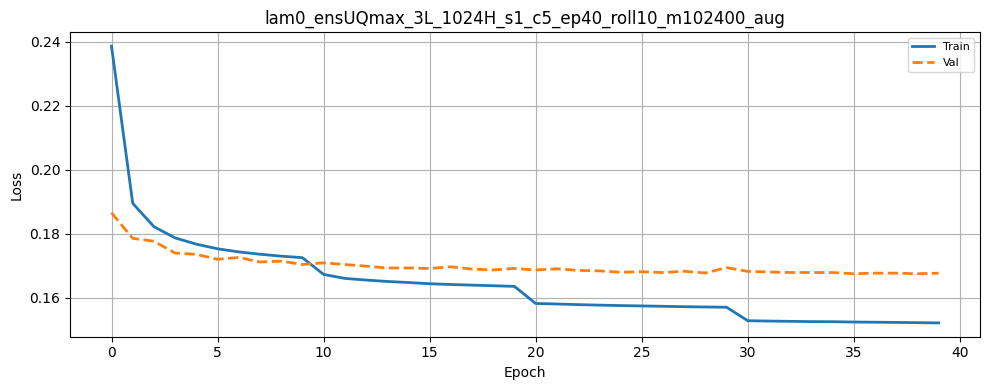

In [ ]:
import matplotlib.pyplot as plt

num_conditions = len(results)

fig, axes = plt.subplots(
    nrows=num_conditions,
    ncols=1,
    figsize=(10, 4 * num_conditions),
    sharex=True
)

# 조건이 1개일 때 axes가 list가 아니라 단일 객체가 되는 것 방지
if num_conditions == 1:
    axes = [axes]

for ax, (setting_name, result) in zip(axes, results.items()):
    ax.plot(result['train_loss'], label="Train", linewidth=2)
    ax.plot(result['val_loss'], linestyle='--', label="Val", linewidth=2)

    ax.set_title(setting_name)
    ax.set_ylabel("Loss")
    ax.grid(True)
    ax.legend(fontsize=8)

axes[-1].set_xlabel("Epoch")

plt.tight_layout()
plt.show()
